In [3]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import glob

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

# Configuration
IMG_HEIGHT = 256
IMG_WIDTH = 256
CHANNELS = 3
BATCH_SIZE = 16
EPOCHS = 1000
LEARNING_RATE = 1e-4

# Data paths
DATA_PATH = "/kaggle/input/csc-seg-data"

def load_and_preprocess_data(data_path, img_height=256, img_width=256):
    """
    Load images that contain both the original image and mask side by side
    """
    images = []
    masks = []
    
    # Get all image files
    image_files = glob.glob(os.path.join(data_path, "*.PNG")) + \
                  glob.glob(os.path.join(data_path, "*.jpg")) + \
                  glob.glob(os.path.join(data_path, "*.jpeg"))
    
    print(f"Found {len(image_files)} images")
    
    for img_path in image_files:
        # Load the combined image
        combined_img = cv2.imread(img_path)
        combined_img = cv2.cvtColor(combined_img, cv2.COLOR_BGR2RGB)
        
        # Get dimensions
        height, width = combined_img.shape[:2]
        
        
        original_img = combined_img[:, :width//2]  # Left half
        mask_img = combined_img[:, width//2:]      # Right half
        
        
        original_img = cv2.resize(original_img, (img_width, img_height))
        mask_img = cv2.resize(mask_img, (img_width, img_height))
        
       
        if len(mask_img.shape) == 3:
            mask_img = cv2.cvtColor(mask_img, cv2.COLOR_RGB2GRAY)
        
        # Normalize mask to 0-1 range
        mask_img = (mask_img > 128).astype(np.float32)
        
        # Normalize original image
        original_img = original_img.astype(np.float32) / 255.0
        
        images.append(original_img)
        masks.append(mask_img)
    
    return np.array(images), np.array(masks)

def unet_model(input_height=256, input_width=256, channels=3):
    """
    UNet model architecture for image segmentation
    """
    inputs = layers.Input((input_height, input_width, channels))
    
    # Encoder (Contracting path)
    c1 = layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
    c1 = layers.Dropout(0.1)(c1)
    c1 = layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)
    
    c2 = layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
    c2 = layers.Dropout(0.1)(c2)
    c2 = layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)
    
    c3 = layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
    c3 = layers.Dropout(0.2)(c3)
    c3 = layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
    p3 = layers.MaxPooling2D((2, 2))(c3)
    
    c4 = layers.Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
    c4 = layers.Dropout(0.2)(c4)
    c4 = layers.Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
    p4 = layers.MaxPooling2D(pool_size=(2, 2))(c4)
    
    # Bottleneck
    c5 = layers.Conv2D(1024, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
    c5 = layers.Dropout(0.3)(c5)
    c5 = layers.Conv2D(1024, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)
    
    # Decoder (Expansive path)
    u6 = layers.Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = layers.concatenate([u6, c4])
    c6 = layers.Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
    c6 = layers.Dropout(0.2)(c6)
    c6 = layers.Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)
    
    u7 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = layers.concatenate([u7, c3])
    c7 = layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
    c7 = layers.Dropout(0.2)(c7)
    c7 = layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)
    
    u8 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = layers.concatenate([u8, c2])
    c8 = layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
    c8 = layers.Dropout(0.1)(c8)
    c8 = layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)
    
    u9 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = layers.concatenate([u9, c1])
    c9 = layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
    c9 = layers.Dropout(0.1)(c9)
    c9 = layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)
    
    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(c9)
    
    model = Model(inputs=[inputs], outputs=[outputs])
    return model

def dice_coefficient(y_true, y_pred, smooth=1e-6):
    """
    Dice coefficient metric for segmentation
    """
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth)

def dice_loss(y_true, y_pred):
    """
    Dice loss for segmentation
    """
    return 1 - dice_coefficient(y_true, y_pred)

def combined_loss(y_true, y_pred):
    """
    Combined Binary Crossentropy and Dice Loss
    """
    bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    dice = dice_loss(y_true, y_pred)
    return bce + dice

def plot_training_history(history):
    """
    Plot training history
    """
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    
    # Plot training & validation accuracy
    axes[0, 0].plot(history.history['dice_coefficient'])
    axes[0, 0].plot(history.history['val_dice_coefficient'])
    axes[0, 0].set_title('Model Dice Coefficient')
    axes[0, 0].set_ylabel('Dice Coefficient')
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].legend(['Train', 'Validation'], loc='upper left')
    
    # Plot training & validation loss
    axes[0, 1].plot(history.history['loss'])
    axes[0, 1].plot(history.history['val_loss'])
    axes[0, 1].set_title('Model Loss')
    axes[0, 1].set_ylabel('Loss')
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].legend(['Train', 'Validation'], loc='upper left')
    
    # Plot learning rate
    if 'lr' in history.history:
        axes[1, 0].plot(history.history['lr'])
        axes[1, 0].set_title('Learning Rate')
        axes[1, 0].set_ylabel('Learning Rate')
        axes[1, 0].set_xlabel('Epoch')
    
    plt.tight_layout()
    plt.show()

def visualize_predictions(model, X_test, y_test, num_samples=5):
    """
    Visualize model predictions
    """
    # Make predictions
    predictions = model.predict(X_test[:num_samples])
    
    fig, axes = plt.subplots(num_samples, 3, figsize=(12, 4*num_samples))
    
    for i in range(num_samples):
        # Original image
        axes[i, 0].imshow(X_test[i])
        axes[i, 0].set_title('Original Image')
        axes[i, 0].axis('off')
        
        # Ground truth mask
        axes[i, 1].imshow(y_test[i].squeeze(), cmap='gray')
        axes[i, 1].set_title('Ground Truth Mask')
        axes[i, 1].axis('off')
        
        # Predicted mask
        pred_mask = (predictions[i].squeeze() > 0.5).astype(np.uint8)
        axes[i, 2].imshow(pred_mask, cmap='gray')
        axes[i, 2].set_title('Predicted Mask')
        axes[i, 2].axis('off')
    
    plt.tight_layout()
    plt.show()

# Main training script
def main():
    print("Loading and preprocessing data...")
    X, y = load_and_preprocess_data(DATA_PATH, IMG_HEIGHT, IMG_WIDTH)
    
    print(f"Data shape - Images: {X.shape}, Masks: {y.shape}")
    
    # Add channel dimension to masks if needed
    if len(y.shape) == 3:
        y = np.expand_dims(y, axis=-1)
    
    # Split the data
    X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)
    
    print(f"Training set: {X_train.shape[0]} samples")
    print(f"Validation set: {X_val.shape[0]} samples")
    print(f"Test set: {X_test.shape[0]} samples")
    
    # Create the model
    print("Creating UNet model...")
    model = unet_model(IMG_HEIGHT, IMG_WIDTH, CHANNELS)
    
    # Compile the model
    model.compile(
        optimizer=Adam(learning_rate=LEARNING_RATE),
        loss=combined_loss,
        metrics=[dice_coefficient, 'binary_accuracy']
    )
    
    # Model summary
    print("\nModel Summary:")
    model.summary()
    
    # Callbacks
    callbacks = [
        ModelCheckpoint(
            'best_unet_model.h5',
            monitor='val_dice_coefficient',
            mode='max',
            save_best_only=True,
            verbose=1
        ),
        EarlyStopping(
            monitor='val_loss',
            patience=15,
            restore_best_weights=True,
            verbose=1
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=10,
            min_lr=1e-7,
            verbose=1
        )
    ]
    
    # Train the model
    print("Starting training...")
    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=EPOCHS,
        batch_size=BATCH_SIZE,
        callbacks=callbacks,
        verbose=1
    )
    
    # Plot training history
    plot_training_history(history)
    
    # Evaluate on test set
    print("Evaluating on test set...")
    test_loss, test_dice, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Test Loss: {test_loss:.4f}")
    print(f"Test Dice Coefficient: {test_dice:.4f}")
    print(f"Test Binary Accuracy: {test_accuracy:.4f}")
    
    # Visualize predictions
    print("Visualizing predictions...")
    visualize_predictions(model, X_test, y_test, num_samples=5)
    
    # Save the final model
    model.save('final_unet_model.h5')
    print("Model saved as 'final_unet_model.h5'")

if __name__ == "__main__":
    main()

Loading and preprocessing data...
Found 115 images
Data shape - Images: (115, 256, 256, 3), Masks: (115, 256, 256)
Training set: 80 samples
Validation set: 17 samples
Test set: 18 samples
Creating UNet model...

Model Summary:


Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_16      │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 256, 256,  │      1,792 │ input_layer_16[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 256, 256,  │          0 │ conv2d_8[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 256, 256,  │     36,928 │ dropout_3[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ conv2d_9[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_10 (Conv2D)  │ (None, 128, 128,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_4 (Dropout) │ (None, 128, 128,  │          0 │ conv2d_10[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_11 (Conv2D)  │ (None, 128, 128,  │    147,584 │ dropout_4[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ conv2d_11[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_12 (Conv2D)  │ (None, 64, 64,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_5 (Dropout) │ (None, 64, 64,    │          0 │ conv2d_12[0][0]   │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_13 (Conv2D)  │ (None, 64, 64,    │    590,080 │ dropout_5[0][0]   │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 32, 32,    │          0 │ conv2d_13[0][0]   │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_14 (Conv2D)  │ (None, 32, 32,    │  1,180,160 │ max_pooling2d_2[… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_6 (Dropout) │ (None, 32, 32,    │          0 │ conv2d_14[0][0]   │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_15 (Conv2D)  │ (None, 32, 32,    │  2,359,808 │ dropout_6[0][0]   │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 16, 16,    │          0 │ conv2d_15[0][0] 

 Total params: 31,031,745 (118.38 MB)

 Trainable params: 31,031,745 (118.38 MB)

 Non-trainable params: 0 (0.00 B)

Starting training...
Epoch 1/1000


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_86']
Received: inputs=Tensor(shape=(16, 256, 256, 3))
  warnings.warn(msg)


KeyboardInterrupt: 

=== STEP 1: Basic Image Splitting ===
Found 115 total images

Processing: 94.PNG
Combined image dimensions: 1230x454x3
Original image shape: (454, 615, 3)
Mask image shape: (454, 615, 3)
Mask min value: 11
Mask max value: 255
Mask unique values: 33

Processing: 48.PNG
Combined image dimensions: 1086x462x3
Original image shape: (462, 543, 3)
Mask image shape: (462, 543, 3)
Mask min value: 0
Mask max value: 255
Mask unique values: 18

Processing: 61.PNG
Combined image dimensions: 1064x470x3
Original image shape: (470, 532, 3)
Mask image shape: (470, 532, 3)
Mask min value: 0
Mask max value: 255
Mask unique values: 19


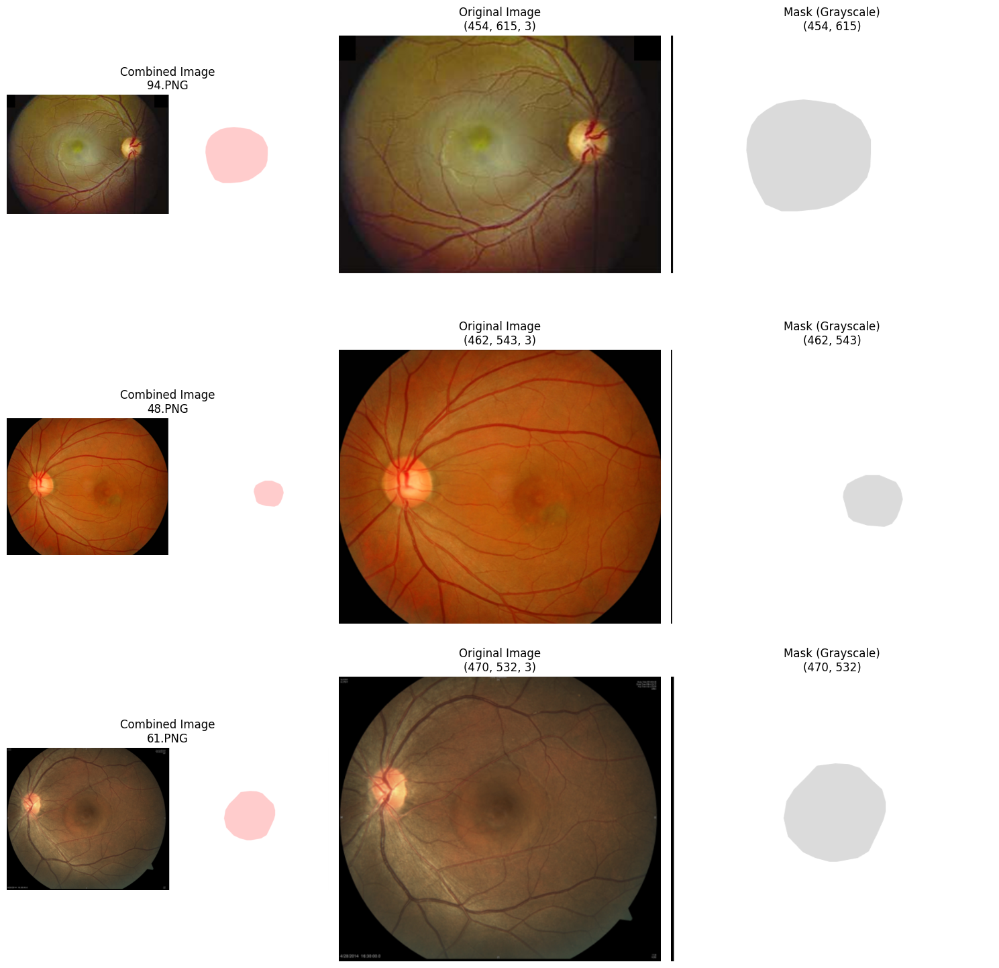


=== STEP 2: Mask Analysis ===

Image 1 - 94.PNG:
  Mask shape: (454, 615)
  Min/Max values: 11/255
  Non-zero pixels: 279210
  Binary (128) - White pixels: 277394
  Binary (Otsu) - White pixels: 277394

Image 2 - 48.PNG:
  Mask shape: (462, 543)
  Min/Max values: 0/255
  Non-zero pixels: 249401
  Binary (128) - White pixels: 249401
  Binary (Otsu) - White pixels: 249401


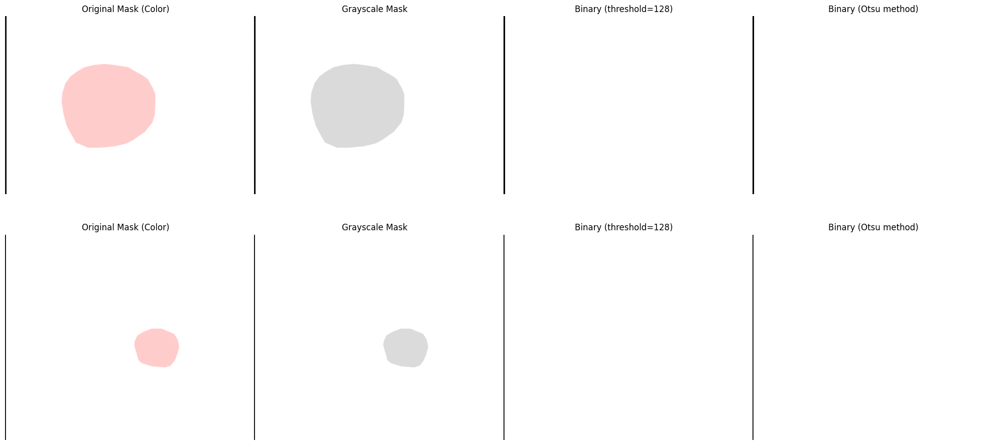


=== STEP 3: Complete Pipeline Test ===
Testing with: 94.PNG


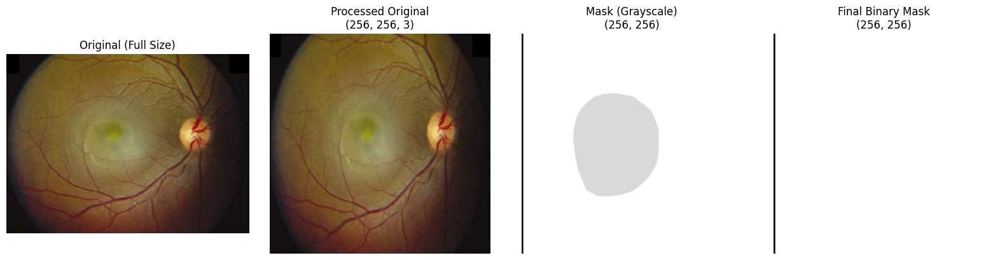

Final shapes:
  Original: (256, 256, 3)
  Mask: (256, 256)
  Original range: [0.000, 0.988]
  Mask range: [0.000, 1.000]
  Mask white pixels: 65024

=== Analysis Complete ===
Check the visualizations above to see if the splitting is correct.
If the masks look good, you can proceed with training!


In [3]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import glob

def load_and_split_sample_images(data_path, num_samples=5):
    """
    Load sample images, split them correctly, and visualize the results
    """
    # Get all image files
    png_files = glob.glob(os.path.join(data_path, "*.png"))
    PNG_files = glob.glob(os.path.join(data_path, "*.PNG"))
    jpg_files = glob.glob(os.path.join(data_path, "*.jpg"))
    JPG_files = glob.glob(os.path.join(data_path, "*.JPG"))
    jpeg_files = glob.glob(os.path.join(data_path, "*.jpeg"))
    JPEG_files = glob.glob(os.path.join(data_path, "*.JPEG"))
    
    image_files = png_files + PNG_files + jpg_files + JPG_files + jpeg_files + JPEG_files
    
    print(f"Found {len(image_files)} total images")
    
    if len(image_files) == 0:
        print("No images found in the specified directory!")
        return
    
    # Take only the first few samples for visualization
    sample_files = image_files[:min(num_samples, len(image_files))]
    
    fig, axes = plt.subplots(len(sample_files), 3, figsize=(15, 5*len(sample_files)))
    
    if len(sample_files) == 1:
        axes = axes.reshape(1, -1)
    
    for i, img_path in enumerate(sample_files):
        print(f"\nProcessing: {os.path.basename(img_path)}")
        
        # Load the combined image
        combined_img = cv2.imread(img_path)
        if combined_img is None:
            print(f"Could not load {img_path}")
            continue
            
        combined_img = cv2.cvtColor(combined_img, cv2.COLOR_BGR2RGB)
        
        # Get dimensions
        height, width, channels = combined_img.shape
        print(f"Combined image dimensions: {width}x{height}x{channels}")
        
        # Show the original combined image first
        axes[i, 0].imshow(combined_img)
        axes[i, 0].set_title(f'Combined Image\n{os.path.basename(img_path)}')
        axes[i, 0].axis('off')
        
        # Split the image in half (assuming left=original, right=mask)
        mid_point = width // 2
        original_img = combined_img[:, :mid_point]  # Left half
        mask_img = combined_img[:, mid_point:]      # Right half
        
        print(f"Original image shape: {original_img.shape}")
        print(f"Mask image shape: {mask_img.shape}")
        
        # Display the separated original image
        axes[i, 1].imshow(original_img)
        axes[i, 1].set_title(f'Original Image\n{original_img.shape}')
        axes[i, 1].axis('off')
        
        # Process and display the mask
        # Convert mask to grayscale if it's colored
        if len(mask_img.shape) == 3:
            mask_gray = cv2.cvtColor(mask_img, cv2.COLOR_RGB2GRAY)
        else:
            mask_gray = mask_img.copy()
        
        # Show mask statistics
        print(f"Mask min value: {mask_gray.min()}")
        print(f"Mask max value: {mask_gray.max()}")
        print(f"Mask unique values: {len(np.unique(mask_gray))}")
        
        # Display the mask in grayscale
        axes[i, 2].imshow(mask_gray, cmap='gray')
        axes[i, 2].set_title(f'Mask (Grayscale)\n{mask_gray.shape}')
        axes[i, 2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return sample_files

def analyze_mask_properties(data_path, num_samples=3):
    """
    Analyze mask properties to determine the best threshold
    """
    # Get image files
    image_files = glob.glob(os.path.join(data_path, "*.[pP][nN][gG]")) + \
                  glob.glob(os.path.join(data_path, "*.[jJ][pP][gG]")) + \
                  glob.glob(os.path.join(data_path, "*.[jJ][pP][eE][gG]"))
    
    sample_files = image_files[:min(num_samples, len(image_files))]
    
    fig, axes = plt.subplots(len(sample_files), 4, figsize=(20, 5*len(sample_files)))
    
    if len(sample_files) == 1:
        axes = axes.reshape(1, -1)
    
    for i, img_path in enumerate(sample_files):
        # Load and split image
        combined_img = cv2.imread(img_path)
        combined_img = cv2.cvtColor(combined_img, cv2.COLOR_BGR2RGB)
        
        height, width = combined_img.shape[:2]
        mid_point = width // 2
        mask_img = combined_img[:, mid_point:]  # Right half (mask)
        
        # Convert to grayscale
        mask_gray = cv2.cvtColor(mask_img, cv2.COLOR_RGB2GRAY)
        
        # Show original mask
        axes[i, 0].imshow(mask_img)
        axes[i, 0].set_title('Original Mask (Color)')
        axes[i, 0].axis('off')
        
        # Show grayscale mask
        axes[i, 1].imshow(mask_gray, cmap='gray')
        axes[i, 1].set_title('Grayscale Mask')
        axes[i, 1].axis('off')
        
        # Try different thresholds
        # Threshold 1: > 128
        mask_binary_128 = (mask_gray > 128).astype(np.uint8) * 255
        axes[i, 2].imshow(mask_binary_128, cmap='gray')
        axes[i, 2].set_title('Binary (threshold=128)')
        axes[i, 2].axis('off')
        
        # Threshold 2: Otsu's method
        _, mask_otsu = cv2.threshold(mask_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        axes[i, 3].imshow(mask_otsu, cmap='gray')
        axes[i, 3].set_title('Binary (Otsu method)')
        axes[i, 3].axis('off')
        
        # Print statistics
        print(f"\nImage {i+1} - {os.path.basename(img_path)}:")
        print(f"  Mask shape: {mask_gray.shape}")
        print(f"  Min/Max values: {mask_gray.min()}/{mask_gray.max()}")
        print(f"  Non-zero pixels: {np.count_nonzero(mask_gray)}")
        print(f"  Binary (128) - White pixels: {np.count_nonzero(mask_binary_128)}")
        print(f"  Binary (Otsu) - White pixels: {np.count_nonzero(mask_otsu)}")
    
    plt.tight_layout()
    plt.show()

def test_data_loading_pipeline(data_path, target_size=(256, 256)):
    """
    Test the complete data loading pipeline
    """
    # Get image files
    image_files = glob.glob(os.path.join(data_path, "*.[pP][nN][gG]")) + \
                  glob.glob(os.path.join(data_path, "*.[jJ][pP][gG]")) + \
                  glob.glob(os.path.join(data_path, "*.[jJ][pP][eE][gG]"))
    
    if len(image_files) == 0:
        print("No images found!")
        return
    
    # Process first image as example
    img_path = image_files[0]
    print(f"Testing with: {os.path.basename(img_path)}")
    
    # Load and split
    combined_img = cv2.imread(img_path)
    combined_img = cv2.cvtColor(combined_img, cv2.COLOR_BGR2RGB)
    
    height, width = combined_img.shape[:2]
    mid_point = width // 2
    
    original_img = combined_img[:, :mid_point]
    mask_img = combined_img[:, mid_point:]
    
    # Resize
    original_resized = cv2.resize(original_img, target_size)
    mask_resized = cv2.resize(mask_img, target_size)
    
    # Convert mask to binary
    mask_gray = cv2.cvtColor(mask_resized, cv2.COLOR_RGB2GRAY)
    mask_binary = (mask_gray > 128).astype(np.float32)
    
    # Normalize original
    original_normalized = original_resized.astype(np.float32) / 255.0
    
    # Visualize final result
    fig, axes = plt.subplots(1, 4, figsize=(16, 4))
    
    axes[0].imshow(original_img)
    axes[0].set_title('Original (Full Size)')
    axes[0].axis('off')
    
    axes[1].imshow(original_normalized)
    axes[1].set_title(f'Processed Original\n{original_normalized.shape}')
    axes[1].axis('off')
    
    axes[2].imshow(mask_gray, cmap='gray')
    axes[2].set_title(f'Mask (Grayscale)\n{mask_gray.shape}')
    axes[2].axis('off')
    
    axes[3].imshow(mask_binary, cmap='gray')
    axes[3].set_title(f'Final Binary Mask\n{mask_binary.shape}')
    axes[3].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"Final shapes:")
    print(f"  Original: {original_normalized.shape}")
    print(f"  Mask: {mask_binary.shape}")
    print(f"  Original range: [{original_normalized.min():.3f}, {original_normalized.max():.3f}]")
    print(f"  Mask range: [{mask_binary.min():.3f}, {mask_binary.max():.3f}]")
    print(f"  Mask white pixels: {np.count_nonzero(mask_binary)}")

# Main execution
def main():
    # Update this path to your actual data path
    DATA_PATH = "/kaggle/input/csc-seg-data"
    
    print("=== STEP 1: Basic Image Splitting ===")
    sample_files = load_and_split_sample_images(DATA_PATH, num_samples=3)
    
    if sample_files:
        print("\n=== STEP 2: Mask Analysis ===")
        analyze_mask_properties(DATA_PATH, num_samples=2)
        
        print("\n=== STEP 3: Complete Pipeline Test ===")
        test_data_loading_pipeline(DATA_PATH, target_size=(256, 256))
    
    print("\n=== Analysis Complete ===")
    print("Check the visualizations above to see if the splitting is correct.")
    print("If the masks look good, you can proceed with training!")

if __name__ == "__main__":
    main()

=== STEP 1: Analyze Current Mask Issues ===
Found 115 images

Processing: 94.PNG
Mask statistics:
  Min value: 11
  Max value: 255
  Mean value: 248.16
  Unique values: 33

Processing: 48.PNG
Mask statistics:
  Min value: 0
  Max value: 255
  Mean value: 252.51
  Unique values: 18

Processing: 61.PNG
Mask statistics:
  Min value: 0
  Max value: 255
  Mean value: 249.58
  Unique values: 19


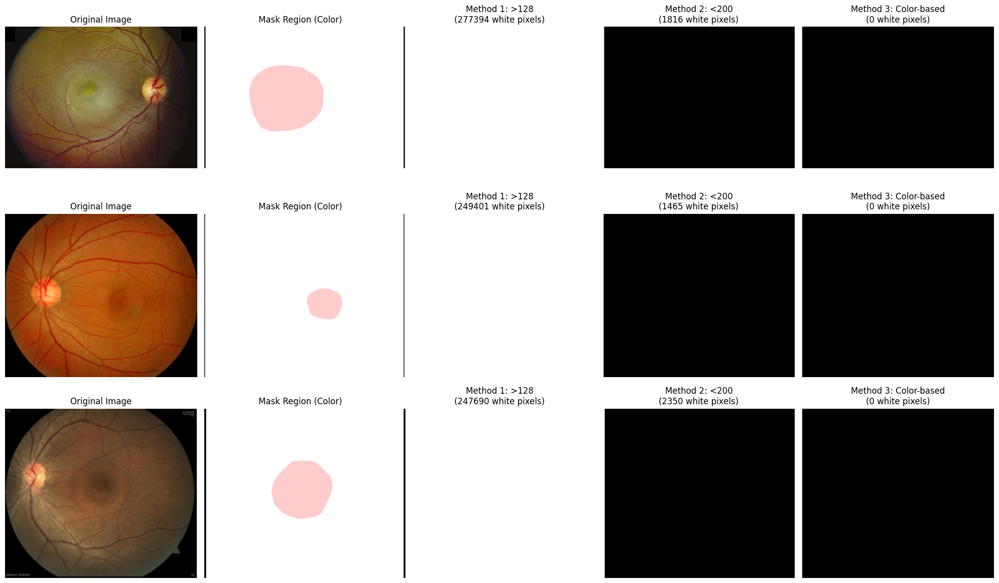


=== STEP 2: Test Different Mask Creation Methods ===
Testing different mask creation methods...

=== Testing Method: SIMPLE ===
Found 115 images
Using mask method: simple
Processing 1/115: 94.PNG
  Mask shape: (256, 256)
  Mask range: [0.0, 1.0]
  White pixels: 65024.0
  Total pixels: 65536
  Percentage white: 99.2%
Processing 2/115: 48.PNG
  Mask shape: (256, 256)
  Mask range: [0.0, 1.0]
  White pixels: 65025.0
  Total pixels: 65536
  Percentage white: 99.2%
Processing 3/115: 61.PNG
  Mask shape: (256, 256)
  Mask range: [0.0, 1.0]
  White pixels: 65024.0
  Total pixels: 65536
  Percentage white: 99.2%
Processing 4/115: 37.PNG
Processing 5/115: 35.PNG
Processing 6/115: 104.PNG
Processing 7/115: 70.PNG
Processing 8/115: 73.PNG
Processing 9/115: 92.PNG
Processing 10/115: 75.PNG
Processing 11/115: 89.PNG
Processing 12/115: 11.PNG
Processing 13/115: 114.PNG
Processing 14/115: 95.PNG
Processing 15/115: 97.PNG
Processing 16/115: 100.PNG
Processing 17/115: 76.PNG
Processing 18/115: 31.PNG


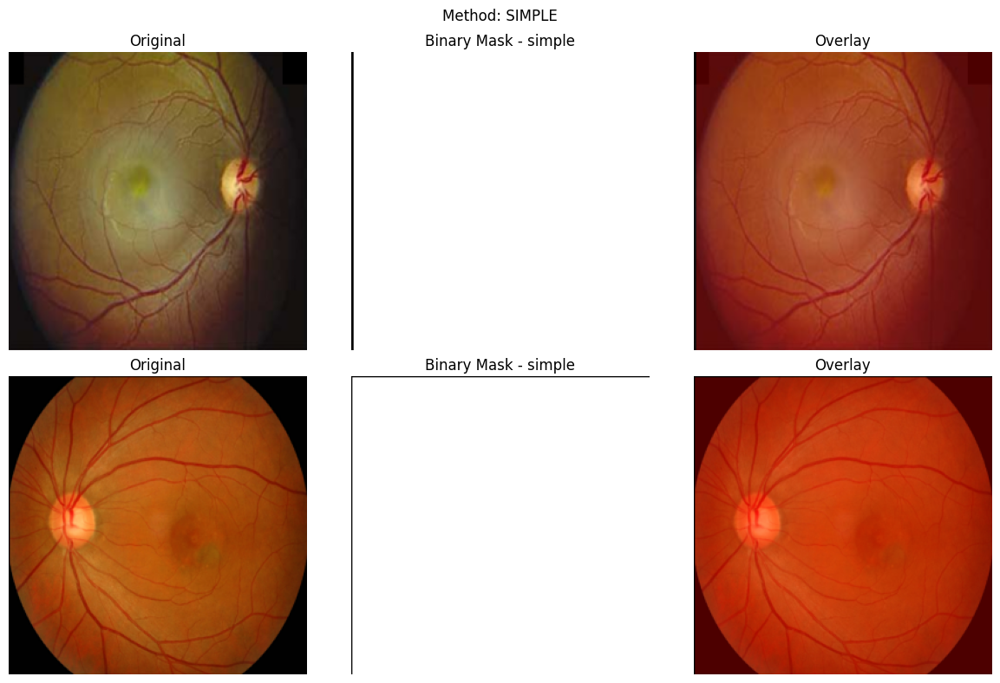

Method simple:
  Average mask coverage: 99.6%
  Mask shape: (115, 256, 256)

=== Testing Method: COLOR_BASED ===
Found 115 images
Using mask method: color_based
Processing 1/115: 94.PNG
  Mask shape: (256, 256)
  Mask range: [0.0, 0.0]
  White pixels: 0.0
  Total pixels: 65536
  Percentage white: 0.0%
Processing 2/115: 48.PNG
  Mask shape: (256, 256)
  Mask range: [0.0, 0.0]
  White pixels: 0.0
  Total pixels: 65536
  Percentage white: 0.0%
Processing 3/115: 61.PNG
  Mask shape: (256, 256)
  Mask range: [0.0, 0.0]
  White pixels: 0.0
  Total pixels: 65536
  Percentage white: 0.0%
Processing 4/115: 37.PNG
Processing 5/115: 35.PNG
Processing 6/115: 104.PNG
Processing 7/115: 70.PNG
Processing 8/115: 73.PNG
Processing 9/115: 92.PNG
Processing 10/115: 75.PNG
Processing 11/115: 89.PNG
Processing 12/115: 11.PNG
Processing 13/115: 114.PNG
Processing 14/115: 95.PNG
Processing 15/115: 97.PNG
Processing 16/115: 100.PNG
Processing 17/115: 76.PNG
Processing 18/115: 31.PNG
Processing 19/115: 4.PNG
P

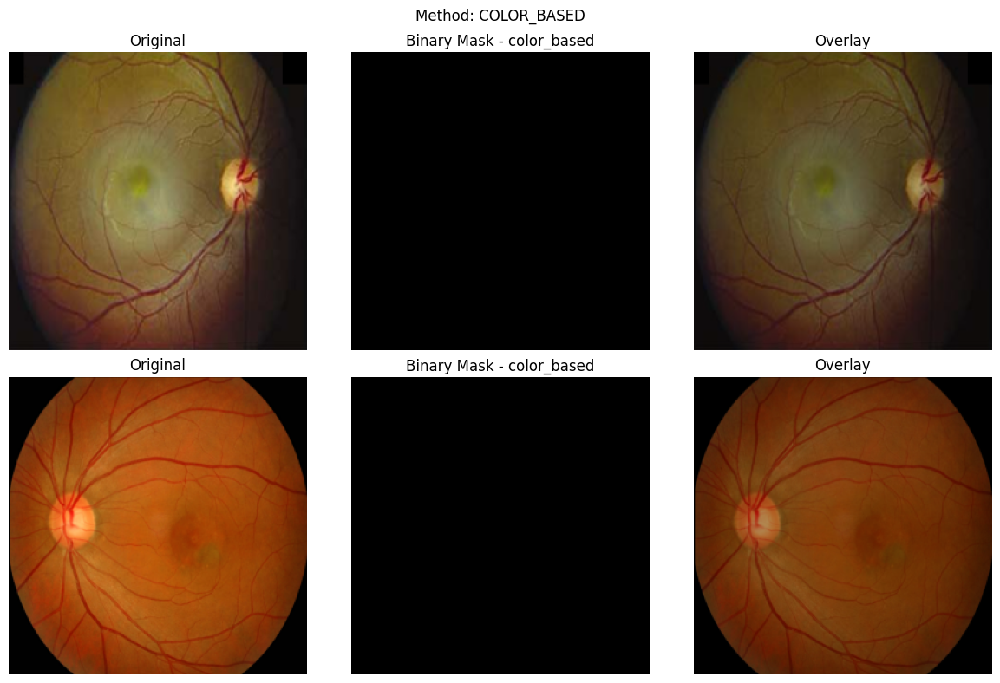

Method color_based:
  Average mask coverage: 0.0%
  Mask shape: (115, 256, 256)

=== Testing Method: GRAYSCALE_INVERTED ===
Found 115 images
Using mask method: grayscale_inverted
Processing 1/115: 94.PNG
  Mask shape: (256, 256)
  Mask range: [0.0, 1.0]
  White pixels: 512.0
  Total pixels: 65536
  Percentage white: 0.8%
Processing 2/115: 48.PNG
  Mask shape: (256, 256)
  Mask range: [0.0, 1.0]
  White pixels: 511.0
  Total pixels: 65536
  Percentage white: 0.8%
Processing 3/115: 61.PNG
  Mask shape: (256, 256)
  Mask range: [0.0, 1.0]
  White pixels: 768.0
  Total pixels: 65536
  Percentage white: 1.2%
Processing 4/115: 37.PNG
Processing 5/115: 35.PNG
Processing 6/115: 104.PNG
Processing 7/115: 70.PNG
Processing 8/115: 73.PNG
Processing 9/115: 92.PNG
Processing 10/115: 75.PNG
Processing 11/115: 89.PNG
Processing 12/115: 11.PNG
Processing 13/115: 114.PNG
Processing 14/115: 95.PNG
Processing 15/115: 97.PNG
Processing 16/115: 100.PNG
Processing 17/115: 76.PNG
Processing 18/115: 31.PNG
Pr

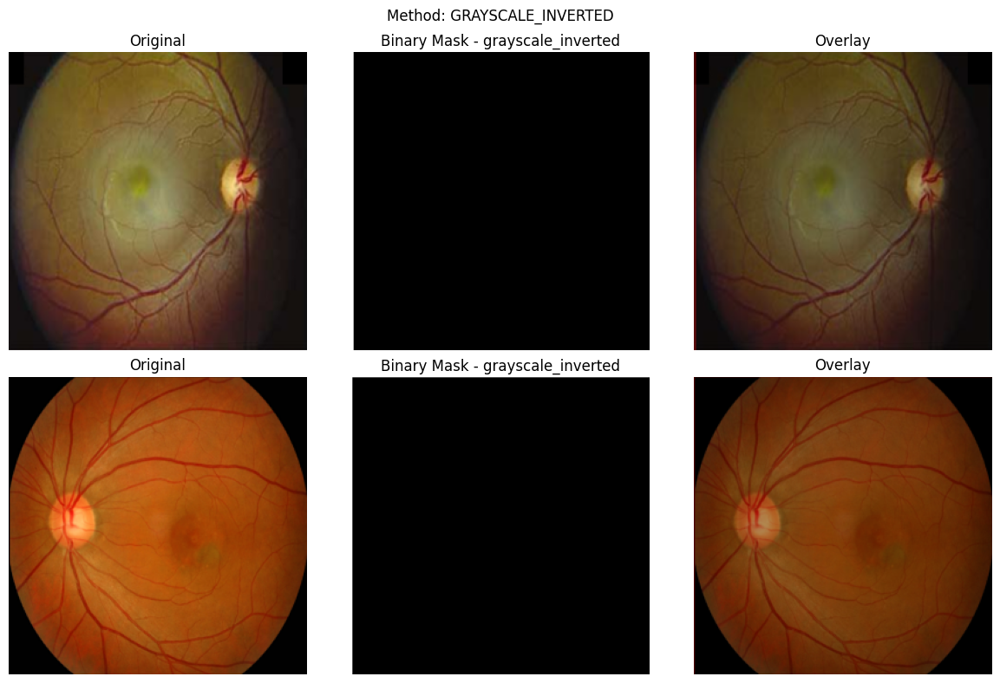

Method grayscale_inverted:
  Average mask coverage: 0.5%
  Mask shape: (115, 256, 256)

=== Testing Method: ADAPTIVE ===
Found 115 images
Using mask method: adaptive
Processing 1/115: 94.PNG
  Mask shape: (256, 256)
  Mask range: [0.0, 1.0]
  White pixels: 63034.0
  Total pixels: 65536
  Percentage white: 96.2%
Processing 2/115: 48.PNG
  Mask shape: (256, 256)
  Mask range: [0.0, 1.0]
  White pixels: 62723.0
  Total pixels: 65536
  Percentage white: 95.7%
Processing 3/115: 61.PNG
  Mask shape: (256, 256)
  Mask range: [0.0, 1.0]
  White pixels: 63339.0
  Total pixels: 65536
  Percentage white: 96.6%
Processing 4/115: 37.PNG
Processing 5/115: 35.PNG
Processing 6/115: 104.PNG
Processing 7/115: 70.PNG
Processing 8/115: 73.PNG
Processing 9/115: 92.PNG
Processing 10/115: 75.PNG
Processing 11/115: 89.PNG
Processing 12/115: 11.PNG
Processing 13/115: 114.PNG
Processing 14/115: 95.PNG
Processing 15/115: 97.PNG
Processing 16/115: 100.PNG
Processing 17/115: 76.PNG
Processing 18/115: 31.PNG
Proces

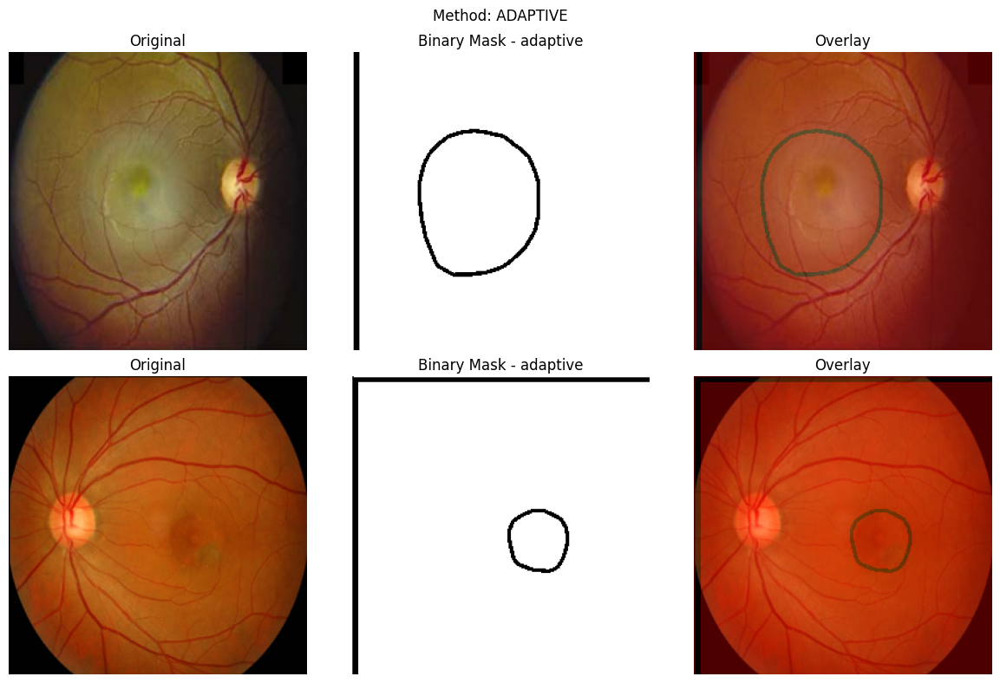

Method adaptive:
  Average mask coverage: 97.4%
  Mask shape: (115, 256, 256)


In [4]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import glob

def load_and_visualize_masks(data_path, num_samples=3):
    """
    Load images and figure out the correct way to create binary masks
    """
    # Get image files
    image_files = glob.glob(os.path.join(data_path, "*.[pP][nN][gG]")) + \
                  glob.glob(os.path.join(data_path, "*.[jJ][pP][gG]")) + \
                  glob.glob(os.path.join(data_path, "*.[jJ][pP][eE][gG]"))
    
    print(f"Found {len(image_files)} images")
    
    if len(image_files) == 0:
        print("No images found!")
        return
    
    # Take first few samples
    sample_files = image_files[:min(num_samples, len(image_files))]
    
    fig, axes = plt.subplots(len(sample_files), 5, figsize=(20, 4*len(sample_files)))
    if len(sample_files) == 1:
        axes = axes.reshape(1, -1)
    
    for i, img_path in enumerate(sample_files):
        print(f"\nProcessing: {os.path.basename(img_path)}")
        
        # Load combined image
        combined_img = cv2.imread(img_path)
        combined_img = cv2.cvtColor(combined_img, cv2.COLOR_BGR2RGB)
        
        height, width = combined_img.shape[:2]
        mid_point = width // 2
        
        # Split image
        original_img = combined_img[:, :mid_point]  # Left half
        mask_img = combined_img[:, mid_point:]      # Right half
        
        # Convert mask to grayscale
        mask_gray = cv2.cvtColor(mask_img, cv2.COLOR_RGB2GRAY)
        
        # Show the mask region statistics
        print(f"Mask statistics:")
        print(f"  Min value: {mask_gray.min()}")
        print(f"  Max value: {mask_gray.max()}")
        print(f"  Mean value: {mask_gray.mean():.2f}")
        print(f"  Unique values: {len(np.unique(mask_gray))}")
        
        # Method 1: Simple threshold (current method)
        mask_binary_simple = (mask_gray > 128).astype(np.uint8)
        
        # Method 2: Invert the logic - treat darker regions as foreground
        # This assumes the optic disc is the lighter region we want to segment
        mask_binary_inverted = (mask_gray < 200).astype(np.uint8)  # Lower threshold
        
        # Method 3: Use the colored mask information
        # Check if mask has specific color (like pink/red regions)
        mask_colored = mask_img.copy()
        # Convert to HSV to better detect colored regions
        mask_hsv = cv2.cvtColor(mask_img, cv2.COLOR_RGB2HSV)
        
        # For pink/red regions (adjust these ranges based on your mask color)
        # Pink color range in HSV
        lower_pink = np.array([140, 50, 50])
        upper_pink = np.array([170, 255, 255])
        mask_color_based = cv2.inRange(mask_hsv, lower_pink, upper_pink)
        mask_color_based = (mask_color_based > 0).astype(np.uint8)
        
        # Display all versions
        axes[i, 0].imshow(original_img)
        axes[i, 0].set_title('Original Image')
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(mask_img)
        axes[i, 1].set_title('Mask Region (Color)')
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(mask_binary_simple, cmap='gray')
        axes[i, 2].set_title(f'Method 1: >128\n({np.sum(mask_binary_simple)} white pixels)')
        axes[i, 2].axis('off')
        
        axes[i, 3].imshow(mask_binary_inverted, cmap='gray')
        axes[i, 3].set_title(f'Method 2: <200\n({np.sum(mask_binary_inverted)} white pixels)')
        axes[i, 3].axis('off')
        
        axes[i, 4].imshow(mask_color_based, cmap='gray')
        axes[i, 4].set_title(f'Method 3: Color-based\n({np.sum(mask_color_based)} white pixels)')
        axes[i, 4].axis('off')
    
    plt.tight_layout()
    plt.show()

def create_correct_binary_mask(mask_img, method='color_based'):
    """
    Create binary mask using the best method identified
    """
    if method == 'color_based':
        # Convert to HSV for better color detection
        mask_hsv = cv2.cvtColor(mask_img, cv2.COLOR_RGB2HSV)
        
        # Pink/red color range (adjust these values based on your mask color)
        lower_bound = np.array([140, 50, 50])   # Lower HSV bound for pink
        upper_bound = np.array([180, 255, 255]) # Upper HSV bound for pink
        
        # Create mask for colored regions
        color_mask = cv2.inRange(mask_hsv, lower_bound, upper_bound)
        binary_mask = (color_mask > 0).astype(np.float32)
        
    elif method == 'grayscale_inverted':
        # Convert to grayscale and use inverted threshold
        mask_gray = cv2.cvtColor(mask_img, cv2.COLOR_RGB2GRAY)
        binary_mask = (mask_gray < 200).astype(np.float32)
        
    elif method == 'adaptive':
        # Use adaptive thresholding
        mask_gray = cv2.cvtColor(mask_img, cv2.COLOR_RGB2GRAY)
        # Invert first, then apply adaptive threshold
        mask_inv = 255 - mask_gray
        adaptive_mask = cv2.adaptiveThreshold(mask_inv, 1, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                            cv2.THRESH_BINARY, 11, 2)
        binary_mask = adaptive_mask.astype(np.float32)
        
    else:  # 'simple'
        mask_gray = cv2.cvtColor(mask_img, cv2.COLOR_RGB2GRAY)
        binary_mask = (mask_gray > 128).astype(np.float32)
    
    return binary_mask

def load_and_preprocess_data_correct(data_path, img_height=256, img_width=256, mask_method='color_based'):
    """
    Correctly load and preprocess the segmentation data
    """
    images = []
    masks = []
    
    # Get all image files
    image_files = glob.glob(os.path.join(data_path, "*.[pP][nN][gG]")) + \
                  glob.glob(os.path.join(data_path, "*.[jJ][pP][gG]")) + \
                  glob.glob(os.path.join(data_path, "*.[jJ][pP][eE][gG]"))
    
    print(f"Found {len(image_files)} images")
    print(f"Using mask method: {mask_method}")
    
    for i, img_path in enumerate(image_files):
        print(f"Processing {i+1}/{len(image_files)}: {os.path.basename(img_path)}")
        
        try:
            # Load combined image
            combined_img = cv2.imread(img_path)
            if combined_img is None:
                print(f"Warning: Could not load {img_path}")
                continue
                
            combined_img = cv2.cvtColor(combined_img, cv2.COLOR_BGR2RGB)
            
            # Get dimensions and split
            height, width = combined_img.shape[:2]
            mid_point = width // 2
            
            original_img = combined_img[:, :mid_point]  # Left half
            mask_img = combined_img[:, mid_point:]      # Right half
            
            # Resize images
            original_img = cv2.resize(original_img, (img_width, img_height))
            mask_img = cv2.resize(mask_img, (img_width, img_height))
            
            # Create binary mask using the correct method
            mask_binary = create_correct_binary_mask(mask_img, method=mask_method)
            
            # Normalize original image
            original_normalized = original_img.astype(np.float32) / 255.0
            
            images.append(original_normalized)
            masks.append(mask_binary)
            
            # Print mask statistics for first few images
            if i < 3:
                print(f"  Mask shape: {mask_binary.shape}")
                print(f"  Mask range: [{mask_binary.min():.1f}, {mask_binary.max():.1f}]")
                print(f"  White pixels: {np.sum(mask_binary)}")
                print(f"  Total pixels: {mask_binary.size}")
                print(f"  Percentage white: {(np.sum(mask_binary)/mask_binary.size)*100:.1f}%")
                
        except Exception as e:
            print(f"Error processing {img_path}: {str(e)}")
            continue
    
    print(f"\nSuccessfully processed {len(images)} images")
    return np.array(images), np.array(masks)

def test_different_methods(data_path, num_samples=2):
    """
    Test different masking methods and let user choose the best one
    """
    print("Testing different mask creation methods...")
    
    methods = ['simple', 'color_based', 'grayscale_inverted', 'adaptive']
    
    for method in methods:
        print(f"\n=== Testing Method: {method.upper()} ===")
        
        try:
            X, y = load_and_preprocess_data_correct(data_path, mask_method=method)
            
            if len(X) == 0:
                print(f"No data loaded with method {method}")
                continue
                
            # Show sample results
            fig, axes = plt.subplots(min(num_samples, len(X)), 3, figsize=(12, 4*min(num_samples, len(X))))
            if min(num_samples, len(X)) == 1:
                axes = axes.reshape(1, -1)
            
            for i in range(min(num_samples, len(X))):
                axes[i, 0].imshow(X[i])
                axes[i, 0].set_title('Original')
                axes[i, 0].axis('off')
                
                axes[i, 1].imshow(y[i], cmap='gray')
                axes[i, 1].set_title(f'Binary Mask - {method}')
                axes[i, 1].axis('off')
                
                # Show overlay
                overlay = X[i].copy()
                mask_colored = np.zeros_like(overlay)
                mask_colored[:,:,0] = y[i]  # Red channel for mask
                overlay = overlay * 0.7 + mask_colored * 0.3
                axes[i, 2].imshow(overlay)
                axes[i, 2].set_title('Overlay')
                axes[i, 2].axis('off')
            
            plt.suptitle(f'Method: {method.upper()}')
            plt.tight_layout()
            plt.show()
            
            # Print statistics
            print(f"Method {method}:")
            print(f"  Average mask coverage: {(np.mean(y)*100):.1f}%")
            print(f"  Mask shape: {y.shape}")
            
        except Exception as e:
            print(f"Error with method {method}: {str(e)}")

# Main function to run the analysis
def main():
    data_path = "/kaggle/input/csc-seg-data"
    
    print("=== STEP 1: Analyze Current Mask Issues ===")
    load_and_visualize_masks(data_path, num_samples=3)
    
    print("\n=== STEP 2: Test Different Mask Creation Methods ===")
    test_different_methods(data_path, num_samples=2)
    
    

if __name__ == "__main__":
    main()

=== Converting and Saving Images and Masks (HSV Method) ===
Goal: Pink mask → White, White background → Black
Created folders:
  Images: /kaggle/working/images1
  Masks: /kaggle/working/masks1
Found 115 images to process
Processing 1/115: 94.PNG
Processing 2/115: 48.PNG
Processing 3/115: 61.PNG
Processing 4/115: 37.PNG
Processing 5/115: 35.PNG
Processing 6/115: 104.PNG
Processing 7/115: 70.PNG
Processing 8/115: 73.PNG
Processing 9/115: 92.PNG
Processing 10/115: 75.PNG
Processing 11/115: 89.PNG
Processing 12/115: 11.PNG
Processing 13/115: 114.PNG
Processing 14/115: 95.PNG
Processing 15/115: 97.PNG
Processing 16/115: 100.PNG
Processing 17/115: 76.PNG
Processing 18/115: 31.PNG
Processing 19/115: 4.PNG
Processing 20/115: 43.PNG
Processing 21/115: 40.PNG
Processing 22/115: 33.PNG
Processing 23/115: 85.PNG
Processing 24/115: 9.PNG
Processing 25/115: 102.PNG
Processing 26/115: 56.PNG
Processing 27/115: 80.PNG
Processing 28/115: 55.PNG
Processing 29/115: 50.PNG
Processing 30/115: 112.PNG
Proce

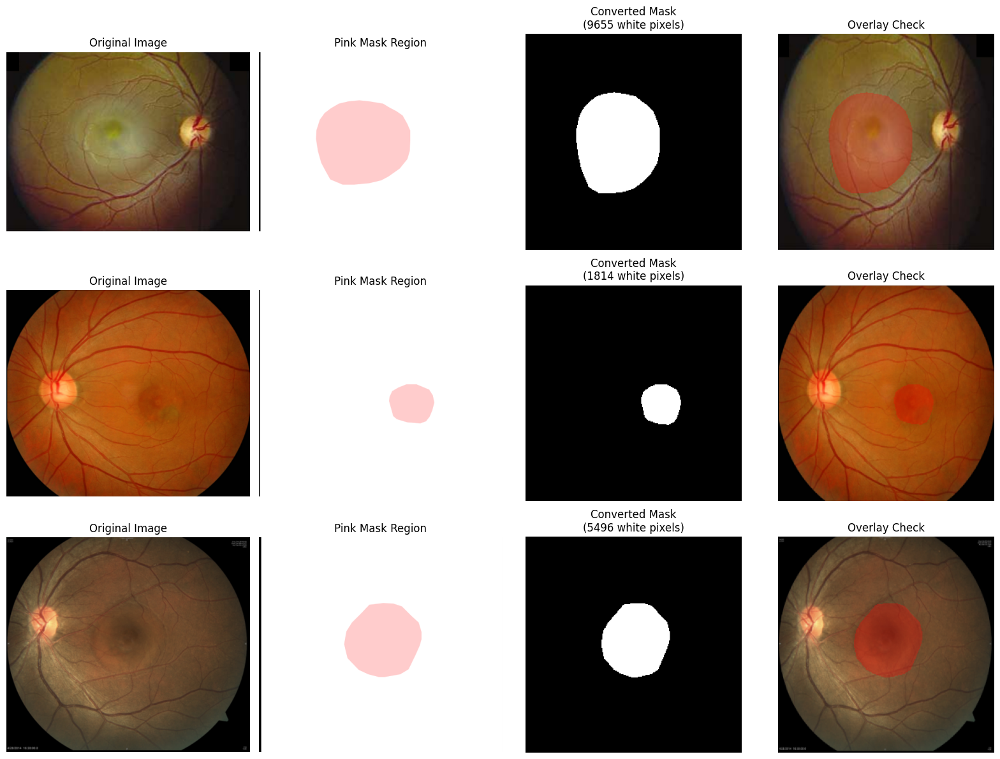


Processing complete!
Successfully processed: 115/115 images
Images saved in: /kaggle/working/images1
Masks saved in: /kaggle/working/masks1

Verification:
Saved images: 115
Saved masks: 115


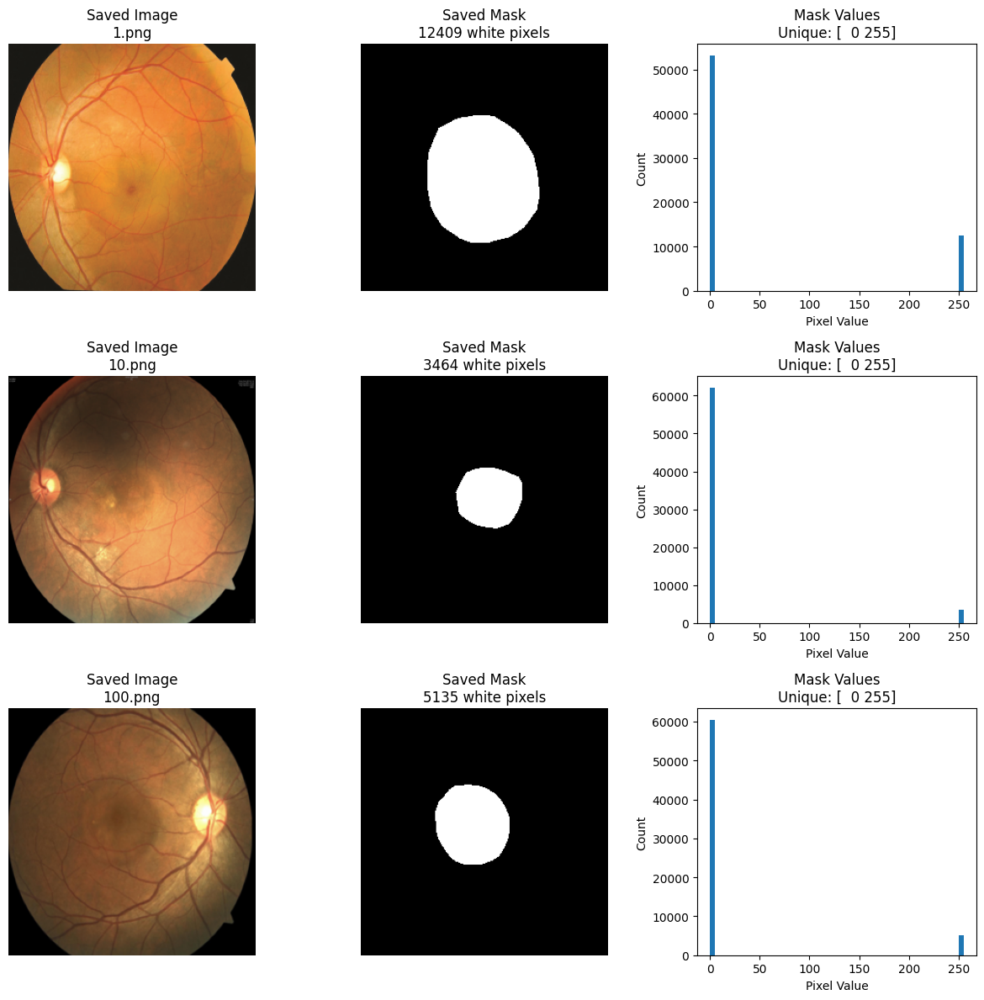

Sample file paths:
  First image: /kaggle/working/images1/1.png
  First mask: /kaggle/working/masks1/1.png

=== CONVERSION COMPLETE ===
✓ 115 images processed and saved using HSV method
✓ Images folder: /kaggle/working/images1
✓ Masks folder: /kaggle/working/masks1
✓ Ready for UNet training!

Saved files:
  115 images in /kaggle/working/images/
  115 masks in /kaggle/working/masks/


In [1]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import glob

# Configuration
DATA_PATH = "/kaggle/input/csc-seg-data"
OUTPUT_PATH = "/kaggle/working/"  # Kaggle working directory
IMG_HEIGHT = 256
IMG_WIDTH = 256

def create_output_folders():
    """Create folders for images and masks"""
    image_folder = os.path.join(OUTPUT_PATH, "images1")
    mask_folder = os.path.join(OUTPUT_PATH, "masks1")
    
    os.makedirs(image_folder, exist_ok=True)
    os.makedirs(mask_folder, exist_ok=True)
    
    print(f"Created folders:")
    print(f"  Images: {image_folder}")
    print(f"  Masks: {mask_folder}")
    
    return image_folder, mask_folder

def convert_mask_background_to_black(mask_img):
    """
    Convert pink mask to white and white background to black using HSV method
    """
    # Convert to HSV for better color detection
    mask_hsv = cv2.cvtColor(mask_img, cv2.COLOR_RGB2HSV)
    
    # HSV range for pink/red colors (broader range that works)
    lower_pink = np.array([0, 30, 30])     # Lower bound
    upper_pink = np.array([20, 255, 255])  # Upper bound
    
    # Create mask for pink regions
    pink_mask = cv2.inRange(mask_hsv, lower_pink, upper_pink)
    
    # No morphological operations to avoid cv2 attribute errors
    return pink_mask

def process_and_save_data(data_path, image_folder, mask_folder, img_height=256, img_width=256):
    """
    Process all images and save them in separate folders
    """
    # Get all image files
    image_files = glob.glob(os.path.join(data_path, "*.[pP][nN][gG]")) + \
                  glob.glob(os.path.join(data_path, "*.[jJ][pP][gG]")) + \
                  glob.glob(os.path.join(data_path, "*.[jJ][pP][eE][gG]"))
    
    print(f"Found {len(image_files)} images to process")
    
    successful_count = 0
    
    # Show first few conversions for verification
    fig, axes = plt.subplots(min(3, len(image_files)), 4, figsize=(16, 4*min(3, len(image_files))))
    if len(image_files) == 1:
        axes = axes.reshape(1, -1)
    elif len(image_files) < 3:
        axes = axes[:len(image_files)]
    
    for i, img_path in enumerate(image_files):
        try:
            print(f"Processing {i+1}/{len(image_files)}: {os.path.basename(img_path)}")
            
            # Load combined image
            combined_img = cv2.imread(img_path)
            if combined_img is None:
                print(f"Warning: Could not load {img_path}")
                continue
                
            combined_img = cv2.cvtColor(combined_img, cv2.COLOR_BGR2RGB)
            
            # Split image
            height, width = combined_img.shape[:2]
            mid_point = width // 2
            
            original_img = combined_img[:, :mid_point]  # Left half
            mask_img = combined_img[:, mid_point:]      # Right half
            
            # Resize both
            original_resized = cv2.resize(original_img, (img_width, img_height))
            mask_resized = cv2.resize(mask_img, (img_width, img_height))
            
            # Convert mask: pink → white, background → black
            binary_mask = convert_mask_background_to_black(mask_resized)
            
            # Generate filename
            base_name = os.path.splitext(os.path.basename(img_path))[0]
            
            # Save original image
            img_save_path = os.path.join(image_folder, f"{base_name}.png")
            cv2.imwrite(img_save_path, cv2.cvtColor(original_resized, cv2.COLOR_RGB2BGR))
            
            # Save binary mask
            mask_save_path = os.path.join(mask_folder, f"{base_name}.png")
            cv2.imwrite(mask_save_path, binary_mask)
            
            successful_count += 1
            
            # Visualize first few for verification
            if i < 3:
                axes[i, 0].imshow(original_img)
                axes[i, 0].set_title('Original Image')
                axes[i, 0].axis('off')
                
                axes[i, 1].imshow(mask_img)
                axes[i, 1].set_title('Pink Mask Region')
                axes[i, 1].axis('off')
                
                axes[i, 2].imshow(binary_mask, cmap='gray')
                axes[i, 2].set_title(f'Converted Mask\n({np.sum(binary_mask > 0)} white pixels)')
                axes[i, 2].axis('off')
                
                # Overlay
                overlay = original_resized.copy().astype(np.float32) / 255.0
                mask_overlay = np.zeros_like(overlay)
                mask_overlay[:,:,0] = (binary_mask > 0).astype(np.float32)  # Red channel
                final_overlay = np.where(binary_mask[..., None] > 0, 
                                       overlay * 0.7 + mask_overlay * 0.3, overlay)
                
                axes[i, 3].imshow(final_overlay)
                axes[i, 3].set_title('Overlay Check')
                axes[i, 3].axis('off')
            
        except Exception as e:
            print(f"Error processing {img_path}: {str(e)}")
            continue
    
    plt.tight_layout()
    plt.show()
    
    print(f"\nProcessing complete!")
    print(f"Successfully processed: {successful_count}/{len(image_files)} images")
    print(f"Images saved in: {image_folder}")
    print(f"Masks saved in: {mask_folder}")
    
    return successful_count

def verify_saved_data(image_folder, mask_folder, num_samples=3):
    """
    Verify the saved images and masks
    """
    image_files = sorted(glob.glob(os.path.join(image_folder, "*.png")))
    mask_files = sorted(glob.glob(os.path.join(mask_folder, "*.png")))
    
    print(f"\nVerification:")
    print(f"Saved images: {len(image_files)}")
    print(f"Saved masks: {len(mask_files)}")
    
    # Show samples
    sample_count = min(num_samples, len(image_files))
    fig, axes = plt.subplots(sample_count, 3, figsize=(12, 4*sample_count))
    if sample_count == 1:
        axes = axes.reshape(1, -1)
    
    for i in range(sample_count):
        # Load saved image and mask
        img = cv2.imread(image_files[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        mask = cv2.imread(mask_files[i], cv2.IMREAD_GRAYSCALE)
        
        # Display
        axes[i, 0].imshow(img)
        axes[i, 0].set_title(f'Saved Image\n{os.path.basename(image_files[i])}')
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(mask, cmap='gray')
        axes[i, 1].set_title(f'Saved Mask\n{np.sum(mask > 0)} white pixels')
        axes[i, 1].axis('off')
        
        # Check mask values
        unique_values = np.unique(mask)
        axes[i, 2].hist(mask.flatten(), bins=50)
        axes[i, 2].set_title(f'Mask Values\nUnique: {unique_values}')
        axes[i, 2].set_xlabel('Pixel Value')
        axes[i, 2].set_ylabel('Count')
    
    plt.tight_layout()
    plt.show()
    
    print(f"Sample file paths:")
    if len(image_files) > 0:
        print(f"  First image: {image_files[0]}")
        print(f"  First mask: {mask_files[0]}")

def test_color_detection(data_path, num_samples=2):
    """
    Test different color detection methods to see which works
    """
    image_files = glob.glob(os.path.join(data_path, "*.[pP][nN][gG]")) + \
                  glob.glob(os.path.join(data_path, "*.[jJ][pP][gG]")) + \
                  glob.glob(os.path.join(data_path, "*.[jJ][pP][eE][gG]"))
    
    sample_files = image_files[:min(num_samples, len(image_files))]
    
    fig, axes = plt.subplots(len(sample_files), 6, figsize=(24, 4*len(sample_files)))
    if len(sample_files) == 1:
        axes = axes.reshape(1, -1)
    
    for i, img_path in enumerate(sample_files):
        print(f"\nTesting: {os.path.basename(img_path)}")
        
        # Load and split
        combined_img = cv2.imread(img_path)
        combined_img = cv2.cvtColor(combined_img, cv2.COLOR_BGR2RGB)
        
        height, width = combined_img.shape[:2]
        mid_point = width // 2
        mask_img = combined_img[:, mid_point:]  # Right half
        
        # Resize
        mask_resized = cv2.resize(mask_img, (256, 256))
        
        # Show original mask
        axes[i, 0].imshow(mask_resized)
        axes[i, 0].set_title('Original Mask')
        axes[i, 0].axis('off')
        
        # Method 1: HSV detection (broader range)
        mask_hsv = cv2.cvtColor(mask_resized, cv2.COLOR_RGB2HSV)
        lower_pink = np.array([0, 30, 30])
        upper_pink = np.array([20, 255, 255])
        method1 = cv2.inRange(mask_hsv, lower_pink, upper_pink)
        
        axes[i, 1].imshow(method1, cmap='gray')
        axes[i, 1].set_title(f'HSV Method\n{np.sum(method1>0)} pixels')
        axes[i, 1].axis('off')
        
        # Method 2: RGB direct detection
        r, g, b = mask_resized[:,:,0], mask_resized[:,:,1], mask_resized[:,:,2]
        method2 = ((r > g) & (r > b) & (r > 100)).astype(np.uint8) * 255
        
        axes[i, 2].imshow(method2, cmap='gray')
        axes[i, 2].set_title(f'RGB Method\n{np.sum(method2>0)} pixels')
        axes[i, 2].axis('off')
        
        # Method 3: Non-white detection
        white_threshold = 200
        method3 = ((r < white_threshold) | (g < white_threshold) | (b < white_threshold)).astype(np.uint8) * 255
        
        axes[i, 3].imshow(method3, cmap='gray')
        axes[i, 3].set_title(f'Non-White\n{np.sum(method3>0)} pixels')
        axes[i, 3].axis('off')
        
        # Method 4: Saturation-based (colored regions)
        s_channel = mask_hsv[:,:,1]
        method4 = (s_channel > 50).astype(np.uint8) * 255
        
        axes[i, 4].imshow(method4, cmap='gray')
        axes[i, 4].set_title(f'Saturation\n{np.sum(method4>0)} pixels')
        axes[i, 4].axis('off')
        
        # Method 5: Simple threshold on pink channel
        # Assuming pink has high red component
        method5 = (r > 180).astype(np.uint8) * 255
        
        axes[i, 5].imshow(method5, cmap='gray')
        axes[i, 5].set_title(f'Red > 180\n{np.sum(method5>0)} pixels')
        axes[i, 5].axis('off')
        
        # Print color stats
        print(f"  RGB stats - R: [{r.min()}, {r.max()}], G: [{g.min()}, {g.max()}], B: [{b.min()}, {b.max()}]")
        print(f"  HSV stats - H: [{mask_hsv[:,:,0].min()}, {mask_hsv[:,:,0].max()}], S: [{mask_hsv[:,:,1].min()}, {mask_hsv[:,:,1].max()}]")
    
    plt.tight_layout()
    plt.show()

def main():
    print("=== Converting and Saving Images and Masks (HSV Method) ===")
    print("Goal: Pink mask → White, White background → Black")
    
    # Create output folders
    image_folder, mask_folder = create_output_folders()
    
    # Process and save all data using HSV method
    success_count = process_and_save_data(DATA_PATH, image_folder, mask_folder, IMG_HEIGHT, IMG_WIDTH)
    
    if success_count > 0:
        # Verify saved data
        verify_saved_data(image_folder, mask_folder, num_samples=3)
        
        print(f"\n=== CONVERSION COMPLETE ===")
        print(f"✓ {success_count} images processed and saved using HSV method")
        print(f"✓ Images folder: {image_folder}")
        print(f"✓ Masks folder: {mask_folder}")
        print(f"✓ Ready for UNet training!")
        
        # Show folder contents
        image_files = glob.glob(os.path.join(image_folder, "*.png"))
        mask_files = glob.glob(os.path.join(mask_folder, "*.png"))
        print(f"\nSaved files:")
        print(f"  {len(image_files)} images in /kaggle/working/images/")
        print(f"  {len(mask_files)} masks in /kaggle/working/masks/")
    else:
        print("❌ No images were successfully processed. Check your data path and format.")

if __name__ == "__main__":
    main()

=== UNet Training for Pink Region Segmentation ===
Loading data from:
  Images: /kaggle/working/images1
  Masks: /kaggle/working/masks1
Found 115 images
Found 115 masks
Loading 1/115: 1.png
Loading 2/115: 10.png
Loading 3/115: 100.png
Loading 4/115: 101.png
Loading 5/115: 102.png
Loading 6/115: 103.png
Loading 7/115: 104.png
Loading 8/115: 105.png
Loading 9/115: 106.png
Loading 10/115: 107.png
Loading 11/115: 108.png
Loading 12/115: 109.png
Loading 13/115: 11.png
Loading 14/115: 110.png
Loading 15/115: 111.png
Loading 16/115: 112.png
Loading 17/115: 113.png
Loading 18/115: 114.png
Loading 19/115: 115.png
Loading 20/115: 12.png
Loading 21/115: 13.png
Loading 22/115: 14.png
Loading 23/115: 15.png
Loading 24/115: 16.png
Loading 25/115: 17.png
Loading 26/115: 18.png
Loading 27/115: 19.png
Loading 28/115: 2.png
Loading 29/115: 20.png
Loading 30/115: 21.png
Loading 31/115: 22.png
Loading 32/115: 23.png
Loading 33/115: 24.png
Loading 34/115: 25.png
Loading 35/115: 26.png
Loading 36/115: 27.pn

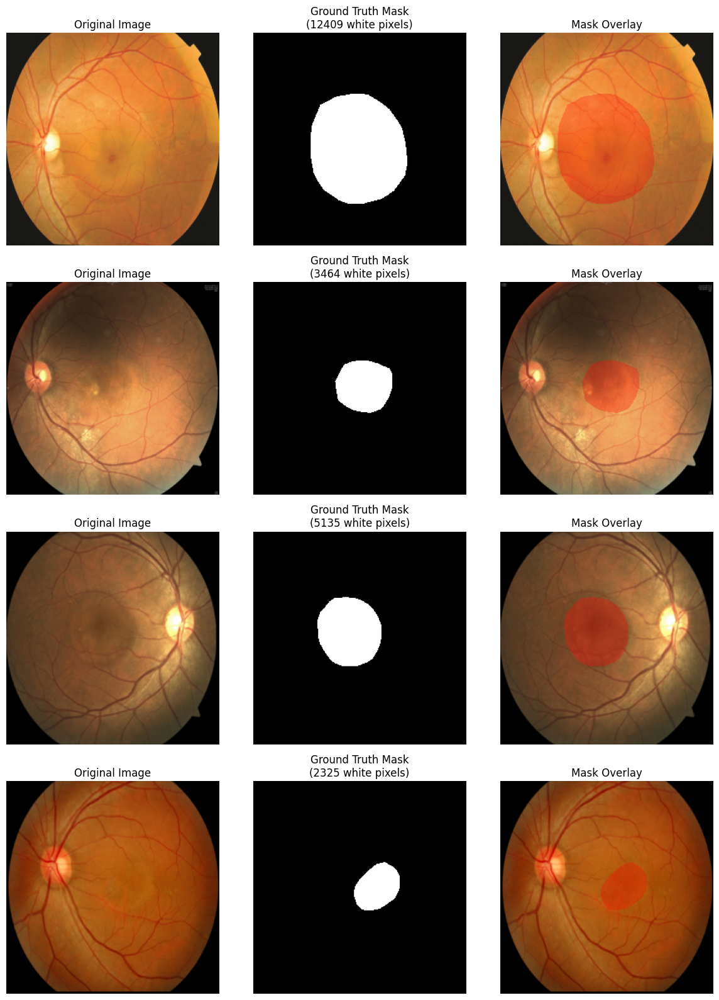


Data split:
  Training: 80 samples
  Validation: 17 samples
  Test: 18 samples

Creating UNet model...
Model created with 31,055,297 parameters


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_43 (Conv2D)  │ (None, 256, 256,  │      1,792 │ input_layer_3[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_43[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_20          │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Dropout)           │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_44 (Conv2D)  │ (None, 256, 256,  │     36,928 │ dropout_20[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_44[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_10    │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_45 (Conv2D)  │ (None, 128, 128,  │     73,856 │ max_pooling2d_10… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_45[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_21          │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Dropout)           │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_46 (Conv2D)  │ (None, 128, 128,  │    147,584 │ dropout_21[0][0]  │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_46[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_11    │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_47 (Conv2D)  │ (None, 64, 64,    │    295,168 │ max_pooling2d_11… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │      1,024 │ conv2d_47[0][0]   │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_22          │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (Dropout)           │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_48 (Conv2D)  │ (None, 64, 64,    │    590,080 │ dropout_22[0][0]

 Total params: 31,055,297 (118.47 MB)

 Trainable params: 31,043,521 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)


Predictions before training:


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_109']
Received: inputs=Tensor(shape=(3, 256, 256, 3))
  warnings.warn(msg)
E0000 00:00:1758789816.996819     102 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1758789817.216030     102 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


Sample 1: Dice = 0.2206, IoU = 0.0164
Sample 2: Dice = 0.2236, IoU = 0.0952
Sample 3: Dice = 0.0805, IoU = 0.0375


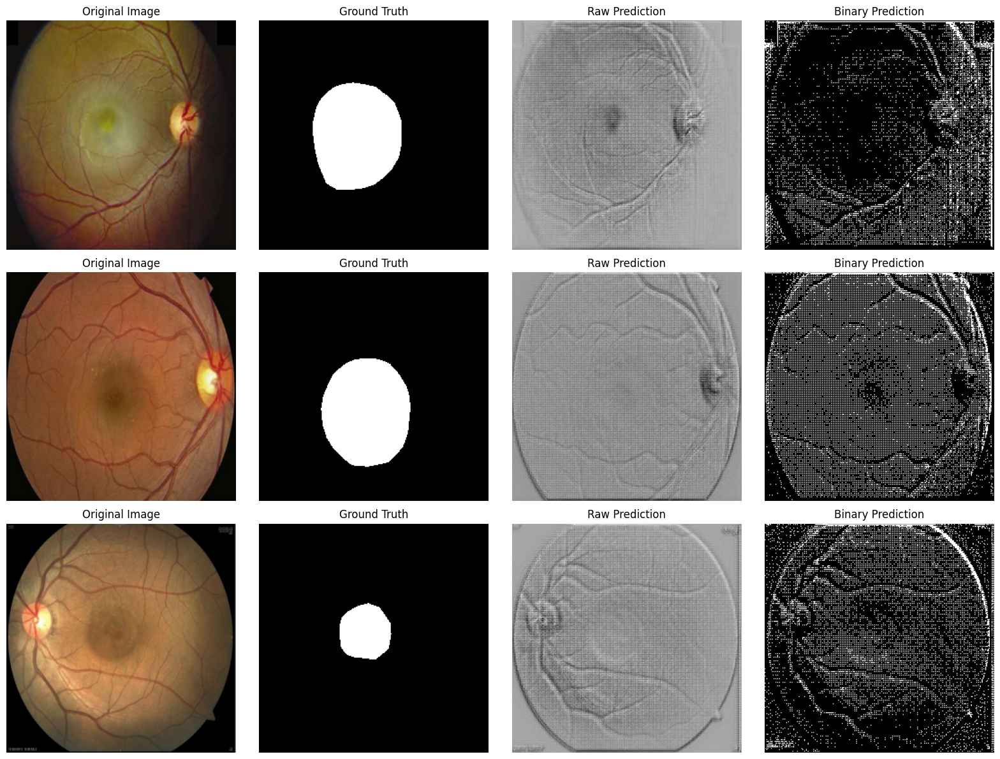


Starting training...
Training for 50 epochs with batch size 16
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_109']
Received: inputs=Tensor(shape=(16, 256, 256, 3))
  warnings.warn(msg)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 889ms/step - binary_accuracy: 0.4693 - dice_coefficient: 0.1374 - iou_metric: 0.0814 - loss: 0.8608

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_109']
Received: inputs=Tensor(shape=(None, 256, 256, 3))
  warnings.warn(msg)



Epoch 1: val_dice_coefficient improved from -inf to 0.09745, saving model to best_unet_segmentation_model.h5
5/5 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - binary_accuracy: 0.4715 - dice_coefficient: 0.1397 - iou_metric: 0.0832 - loss: 0.8585 - val_binary_accuracy: 0.1250 - val_dice_coefficient: 0.0975 - val_iou_metric: 0.0560 - val_loss: 0.8182 - learning_rate: 1.0000e-04
Epoch 2/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 907ms/step - binary_accuracy: 0.5101 - dice_coefficient: 0.1564 - iou_metric: 0.1013 - loss: 0.8296
Epoch 2: val_dice_coefficient improved from 0.09745 to 0.09768, saving model to best_unet_segmentation_model.h5
5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - binary_accuracy: 0.5109 - dice_coefficient: 0.1576 - iou_metric: 0.1022 - loss: 0.8278 - val_binary_accuracy: 0.0963 - val_dice_coefficient: 0.0977 - val_iou_metric: 0.0546 - val_loss: 0.8219 - learning_rate: 1.0000e-04
Epoch 3/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 925ms/step - binary_accuracy: 0.5236 - dice_coefficient: 0.1550 - iou_metric: 0.103

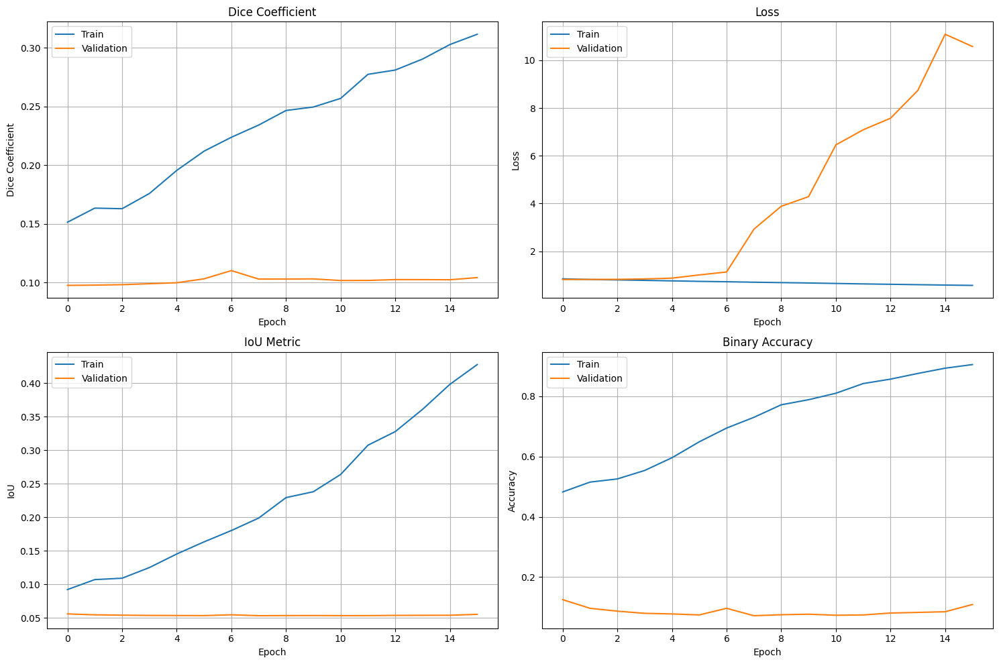


Loading best model and evaluating...
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - binary_accuracy: 0.1150 - dice_coefficient: 0.1738 - iou_metric: 0.0901 - loss: 1.0977

=== TEST RESULTS ===
Loss: 1.0977
Dice Coefficient: 0.1738
IoU: 0.0901
Binary Accuracy: 0.1150

Final predictions on test set:


E0000 00:00:1758789965.193137     101 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1758789965.420251     101 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


Sample 1: Dice = 0.2549, IoU = 0.1496
Sample 2: Dice = 0.2749, IoU = 0.1493
Sample 3: Dice = 0.0951, IoU = 0.0457
Sample 4: Dice = 0.2666, IoU = 0.1458
Sample 5: Dice = 0.3298, IoU = 0.1906
Sample 6: Dice = 0.0438, IoU = 0.0200


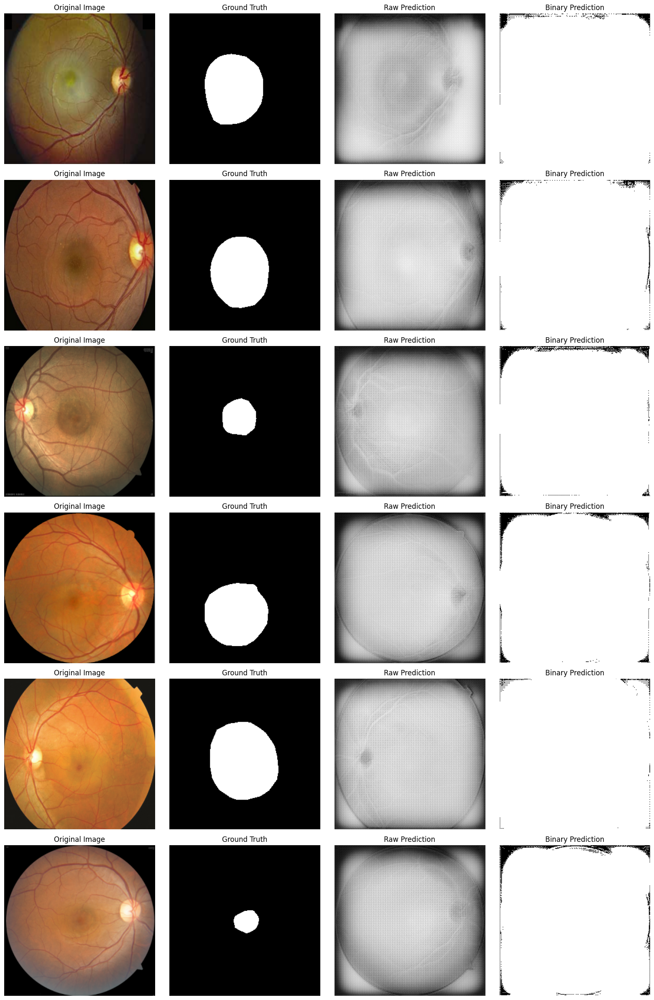


=== TRAINING COMPLETE ===
✓ Model saved as 'best_unet_segmentation_model.h5'
✓ Best validation Dice coefficient achieved
✓ Ready for inference on new images!


In [13]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import glob

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

# Configuration
IMG_HEIGHT = 256
IMG_WIDTH = 256
CHANNELS = 3
BATCH_SIZE = 16
EPOCHS = 50
LEARNING_RATE = 1e-4

# Data paths
IMAGES_PATH = "/kaggle/working/images1"
MASKS_PATH = "/kaggle/working/masks1"

def load_data_from_folders(images_path, masks_path):
    """
    Load images and masks from separate folders
    """
    # Get all image files
    image_files = sorted(glob.glob(os.path.join(images_path, "*.png")))
    mask_files = sorted(glob.glob(os.path.join(masks_path, "*.png")))
    
    print(f"Found {len(image_files)} images")
    print(f"Found {len(mask_files)} masks")
    
    if len(image_files) != len(mask_files):
        print("Warning: Number of images and masks don't match!")
    
    if len(image_files) == 0:
        raise ValueError("No images found!")
    
    images = []
    masks = []
    
    for i, (img_path, mask_path) in enumerate(zip(image_files, mask_files)):
        print(f"Loading {i+1}/{len(image_files)}: {os.path.basename(img_path)}")
        
        try:
            # Load image
            image = cv2.imread(img_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            
            # Load mask
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
            
            # Normalize image to [0, 1]
            image_normalized = image.astype(np.float32) / 255.0
            
            # Normalize mask to [0, 1] (it should already be 0 or 255)
            mask_normalized = (mask > 128).astype(np.float32)
            
            images.append(image_normalized)
            masks.append(mask_normalized)
            
        except Exception as e:
            print(f"Error loading {img_path}: {str(e)}")
            continue
    
    print(f"Successfully loaded {len(images)} image-mask pairs")
    return np.array(images), np.array(masks)

def visualize_data_samples(X, y, num_samples=4):
    """
    Visualize some data samples
    """
    fig, axes = plt.subplots(num_samples, 3, figsize=(12, 4*num_samples))
    if num_samples == 1:
        axes = axes.reshape(1, -1)
    
    for i in range(min(num_samples, len(X))):
        # Original image
        axes[i, 0].imshow(X[i])
        axes[i, 0].set_title('Original Image')
        axes[i, 0].axis('off')
        
        # Ground truth mask - squeeze to remove extra dimensions
        mask_2d = y[i].squeeze()  # Remove any extra dimensions
        axes[i, 1].imshow(mask_2d, cmap='gray')
        axes[i, 1].set_title(f'Ground Truth Mask\n({np.sum(mask_2d):.0f} white pixels)')
        axes[i, 1].axis('off')
        
        # Overlay
        overlay = X[i].copy()
        mask_colored = np.zeros_like(overlay)
        mask_colored[:,:,0] = mask_2d  # Red channel for mask
        overlay = np.where(mask_2d[..., None] > 0.5, 
                          overlay * 0.7 + mask_colored * 0.3, overlay)
        
        axes[i, 2].imshow(overlay)
        axes[i, 2].set_title('Mask Overlay')
        axes[i, 2].axis('off')
    
    plt.tight_layout()
    plt.show()

def unet_model(input_height=256, input_width=256, channels=3):
    """
    UNet model for segmentation
    """
    inputs = layers.Input((input_height, input_width, channels))
    
    # Encoder (Contracting path)
    c1 = layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
    c1 = layers.BatchNormalization()(c1)
    c1 = layers.Dropout(0.1)(c1)
    c1 = layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
    c1 = layers.BatchNormalization()(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)
    
    c2 = layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
    c2 = layers.BatchNormalization()(c2)
    c2 = layers.Dropout(0.1)(c2)
    c2 = layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
    c2 = layers.BatchNormalization()(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)
    
    c3 = layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
    c3 = layers.BatchNormalization()(c3)
    c3 = layers.Dropout(0.2)(c3)
    c3 = layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
    c3 = layers.BatchNormalization()(c3)
    p3 = layers.MaxPooling2D((2, 2))(c3)
    
    c4 = layers.Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
    c4 = layers.BatchNormalization()(c4)
    c4 = layers.Dropout(0.2)(c4)
    c4 = layers.Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
    c4 = layers.BatchNormalization()(c4)
    p4 = layers.MaxPooling2D(pool_size=(2, 2))(c4)
    
    # Bottleneck
    c5 = layers.Conv2D(1024, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
    c5 = layers.BatchNormalization()(c5)
    c5 = layers.Dropout(0.3)(c5)
    c5 = layers.Conv2D(1024, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)
    c5 = layers.BatchNormalization()(c5)
    
    # Decoder (Expansive path)
    u6 = layers.Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = layers.concatenate([u6, c4])
    c6 = layers.Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
    c6 = layers.BatchNormalization()(c6)
    c6 = layers.Dropout(0.2)(c6)
    c6 = layers.Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)
    c6 = layers.BatchNormalization()(c6)
    
    u7 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = layers.concatenate([u7, c3])
    c7 = layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
    c7 = layers.BatchNormalization()(c7)
    c7 = layers.Dropout(0.2)(c7)
    c7 = layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)
    c7 = layers.BatchNormalization()(c7)
    
    u8 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = layers.concatenate([u8, c2])
    c8 = layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
    c8 = layers.BatchNormalization()(c8)
    c8 = layers.Dropout(0.1)(c8)
    c8 = layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)
    c8 = layers.BatchNormalization()(c8)
    
    u9 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = layers.concatenate([u9, c1])
    c9 = layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
    c9 = layers.BatchNormalization()(c9)
    c9 = layers.Dropout(0.1)(c9)
    c9 = layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)
    c9 = layers.BatchNormalization()(c9)
    
    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(c9)
    
    model = Model(inputs=[inputs], outputs=[outputs])
    return model

def dice_coefficient(y_true, y_pred, smooth=1e-6):
    """Dice coefficient metric"""
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth)

def dice_loss(y_true, y_pred):
    """Dice loss"""
    return 1 - dice_coefficient(y_true, y_pred)

def iou_metric(y_true, y_pred, threshold=0.5):
    """IoU (Intersection over Union) metric"""
    y_pred_binary = tf.cast(y_pred > threshold, tf.float32)
    intersection = tf.reduce_sum(y_true * y_pred_binary)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred_binary) - intersection
    return intersection / (union + 1e-6)

def combined_loss(y_true, y_pred):
    """Combined Binary Crossentropy and Dice Loss"""
    bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    dice = dice_loss(y_true, y_pred)
    return 0.5 * bce + 0.5 * dice

def visualize_predictions(model, X_test, y_test, num_samples=4):
    """Visualize model predictions"""
    predictions = model.predict(X_test[:num_samples], verbose=0)
    
    fig, axes = plt.subplots(num_samples, 4, figsize=(16, 4*num_samples))
    if num_samples == 1:
        axes = axes.reshape(1, -1)
    
    for i in range(num_samples):
        # Original image
        axes[i, 0].imshow(X_test[i])
        axes[i, 0].set_title('Original Image')
        axes[i, 0].axis('off')
        
        # Ground truth mask
        axes[i, 1].imshow(y_test[i].squeeze(), cmap='gray')
        axes[i, 1].set_title('Ground Truth')
        axes[i, 1].axis('off')
        
        # Raw prediction
        axes[i, 2].imshow(predictions[i].squeeze(), cmap='gray')
        axes[i, 2].set_title('Raw Prediction')
        axes[i, 2].axis('off')
        
        # Thresholded prediction
        pred_binary = (predictions[i].squeeze() > 0.5).astype(np.uint8)
        axes[i, 3].imshow(pred_binary, cmap='gray')
        axes[i, 3].set_title('Binary Prediction')
        axes[i, 3].axis('off')
        
        # Calculate metrics for this sample
        dice = dice_coefficient(tf.constant(y_test[i:i+1]), tf.constant(predictions[i:i+1]))
        iou = iou_metric(tf.constant(y_test[i:i+1]), tf.constant(predictions[i:i+1]))
        print(f"Sample {i+1}: Dice = {dice:.4f}, IoU = {iou:.4f}")
    
    plt.tight_layout()
    plt.show()

def plot_training_history(history):
    """Plot training history"""
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    
    # Dice coefficient
    axes[0, 0].plot(history.history['dice_coefficient'], label='Train')
    axes[0, 0].plot(history.history['val_dice_coefficient'], label='Validation')
    axes[0, 0].set_title('Dice Coefficient')
    axes[0, 0].set_ylabel('Dice Coefficient')
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].legend()
    axes[0, 0].grid(True)
    
    # Loss
    axes[0, 1].plot(history.history['loss'], label='Train')
    axes[0, 1].plot(history.history['val_loss'], label='Validation')
    axes[0, 1].set_title('Loss')
    axes[0, 1].set_ylabel('Loss')
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].legend()
    axes[0, 1].grid(True)
    
    # IoU
    axes[1, 0].plot(history.history['iou_metric'], label='Train')
    axes[1, 0].plot(history.history['val_iou_metric'], label='Validation')
    axes[1, 0].set_title('IoU Metric')
    axes[1, 0].set_ylabel('IoU')
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].legend()
    axes[1, 0].grid(True)
    
    # Binary accuracy
    axes[1, 1].plot(history.history['binary_accuracy'], label='Train')
    axes[1, 1].plot(history.history['val_binary_accuracy'], label='Validation')
    axes[1, 1].set_title('Binary Accuracy')
    axes[1, 1].set_ylabel('Accuracy')
    axes[1, 1].set_xlabel('Epoch')
    axes[1, 1].legend()
    axes[1, 1].grid(True)
    
    plt.tight_layout()
    plt.show()

def main():
    print("=== UNet Training for Pink Region Segmentation ===")
    print(f"Loading data from:")
    print(f"  Images: {IMAGES_PATH}")
    print(f"  Masks: {MASKS_PATH}")
    
    # Load data
    X, y = load_data_from_folders(IMAGES_PATH, MASKS_PATH)
    
    # Add channel dimension to masks if needed
    if len(y.shape) == 3:
        y = np.expand_dims(y, axis=-1)
    
    print(f"\nData loaded:")
    print(f"  Images shape: {X.shape}")
    print(f"  Masks shape: {y.shape}")
    print(f"  Image range: [{X.min():.3f}, {X.max():.3f}]")
    print(f"  Mask range: [{y.min():.3f}, {y.max():.3f}]")
    
    # Visualize some samples
    print("\nVisualizing data samples:")
    visualize_data_samples(X, y, num_samples=4)
    
    # Split the data
    X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42, stratify=None)
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=None)
    
    print(f"\nData split:")
    print(f"  Training: {X_train.shape[0]} samples")
    print(f"  Validation: {X_val.shape[0]} samples")
    print(f"  Test: {X_test.shape[0]} samples")
    
    # Create the model
    print("\nCreating UNet model...")
    model = unet_model(IMG_HEIGHT, IMG_WIDTH, CHANNELS)
    
    # Compile the model
    model.compile(
        optimizer=Adam(learning_rate=LEARNING_RATE),
        loss=combined_loss,
        metrics=[dice_coefficient, iou_metric, 'binary_accuracy']
    )
    
    print(f"Model created with {model.count_params():,} parameters")
    
    # Model summary
    model.summary()
    
    # Callbacks
    callbacks = [
        ModelCheckpoint(
            'best_unet_segmentation_model.h5',
            monitor='val_dice_coefficient',
            mode='max',
            save_best_only=True,
            save_weights_only=False,
            verbose=1
        ),
        EarlyStopping(
            monitor='val_loss',
            patience=15,
            restore_best_weights=True,
            verbose=1
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=8,
            min_lr=1e-7,
            verbose=1
        )
    ]
    
    # Show predictions before training
    print("\nPredictions before training:")
    visualize_predictions(model, X_test, y_test, num_samples=3)
    
    # Train the model
    print("\nStarting training...")
    print(f"Training for {EPOCHS} epochs with batch size {BATCH_SIZE}")
    
    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=EPOCHS,
        batch_size=BATCH_SIZE,
        callbacks=callbacks,
        verbose=1
    )
    
    # Plot training history
    print("\nTraining completed! Plotting history...")
    plot_training_history(history)
    
    # Load best model and evaluate
    print("\nLoading best model and evaluating...")
    model.load_weights('best_unet_segmentation_model.h5')
    
    # Evaluate on test set
    test_results = model.evaluate(X_test, y_test, verbose=1)
    print(f"\n=== TEST RESULTS ===")
    print(f"Loss: {test_results[0]:.4f}")
    print(f"Dice Coefficient: {test_results[1]:.4f}")
    print(f"IoU: {test_results[2]:.4f}")
    print(f"Binary Accuracy: {test_results[3]:.4f}")
    
    # Show final predictions
    print("\nFinal predictions on test set:")
    visualize_predictions(model, X_test, y_test, num_samples=6)
    
    print(f"\n=== TRAINING COMPLETE ===")
    print(f"✓ Model saved as 'best_unet_segmentation_model.h5'")
    print(f"✓ Best validation Dice coefficient achieved")
    print(f"✓ Ready for inference on new images!")

if __name__ == "__main__":
    main()

Starting segmentation training...
Loading data...
Found 115 images and 115 masks


100%|██████████| 115/115 [00:00<00:00, 405.78it/s]


Loaded 115 image-mask pairs
Image shape: (256, 256, 3)
Mask shape: (256, 256, 1)
Training set: 73 samples
Validation set: 19 samples
Test set: 23 samples
Creating model...
Model summary:


Model: "segmentation_generator"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_17      │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_15       │ (None, 128, 128,  │      3,072 │ input_layer_17[0… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_16       │ (None, 64, 64,    │    131,584 │ sequential_15[0]… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_17       │ (None, 32, 32,    │    525,312 │ sequential_16[0]… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_18       │ (None, 16, 16,    │  2,099,200 │ sequential_17[0]… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_19       │ (None, 8, 8, 512) │  4,196,352 │ sequential_18[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_20       │ (None, 4, 4, 512) │  4,196,352 │ sequential_19[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_21       │ (None, 2, 2, 512) │  4,196,352 │ sequential_20[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_22       │ (None, 1, 1, 512) │  4,196,352 │ sequential_21[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_23       │ (None, 2, 2, 512) │  4,196,352 │ sequential_22[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_11      │ (None, 2, 2,      │          0 │ sequential_23[0]… │
│ (Concatenate)       │ 1024)             │            │ sequential_21[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_24       │ (None, 4, 4, 512) │  8,390,656 │ concatenate_11[0… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_12      │ (None, 4, 4,      │          0 │ sequential_24[0]… │
│ (Concatenate)       │ 1024)             │            │ sequential_20[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_25       │ (None, 8, 8, 512) │  8,390,656 │ concatenate_12[0… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_13      │ (None, 8, 8,      │          0 │ sequential_25[0]… │
│ (Concatenate)       │ 1024)             │            │ sequential_19[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_26       │ (None, 16, 16,    │  8,390,656 │ concatenate_13[0… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_14      │ (None, 16, 16,    │          0 │ sequential_26[0]

 Total params: 54,421,761 (207.60 MB)

 Trainable params: 54,410,881 (207.56 MB)

 Non-trainable params: 10,880 (42.50 KB)

Starting training...
Epoch 1/1000
5/5 ━━━━━━━━━━━━━━━━━━━━ 31s 3s/step - accuracy: 0.4215 - dice_coefficient: 0.1198 - iou_score: 0.0638 - loss: 0.1398 - val_accuracy: 0.8674 - val_dice_coefficient: 0.1263 - val_iou_score: 0.0681 - val_loss: 0.1185 - learning_rate: 1.0000e-04
Epoch 2/1000
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 277ms/step - accuracy: 0.5446 - dice_coefficient: 0.1150 - iou_score: 0.0611 - loss: 0.1187 - val_accuracy: 0.8701 - val_dice_coefficient: 0.1261 - val_iou_score: 0.0680 - val_loss: 0.1169 - learning_rate: 1.0000e-04
Epoch 3/1000
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 274ms/step - accuracy: 0.7615 - dice_coefficient: 0.1175 - iou_score: 0.0624 - loss: 0.1045 - val_accuracy: 0.8833 - val_dice_coefficient: 0.1259 - val_iou_score: 0.0679 - val_loss: 0.1150 - learning_rate: 1.0000e-04
Epoch 4/1000
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 279ms/step - accuracy: 0.8740 - dice_coefficient: 0.1235 - iou_score: 0.0659 - loss: 0.0941 - val_accuracy: 0.8968 - val_dice_coefficient: 0.1256 - val_iou_score: 0.0

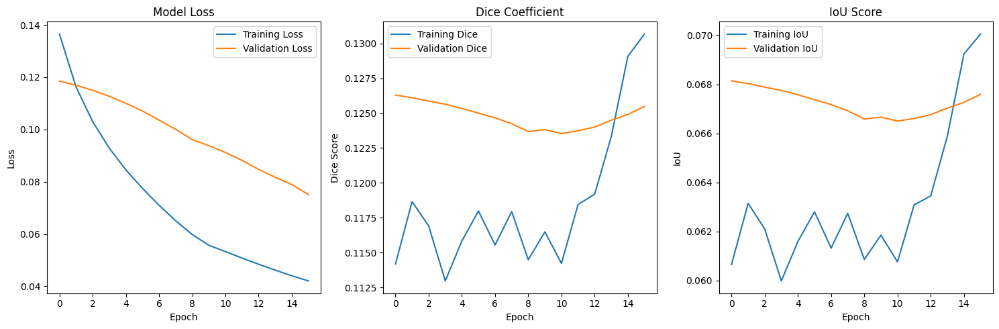

Generating prediction examples...
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


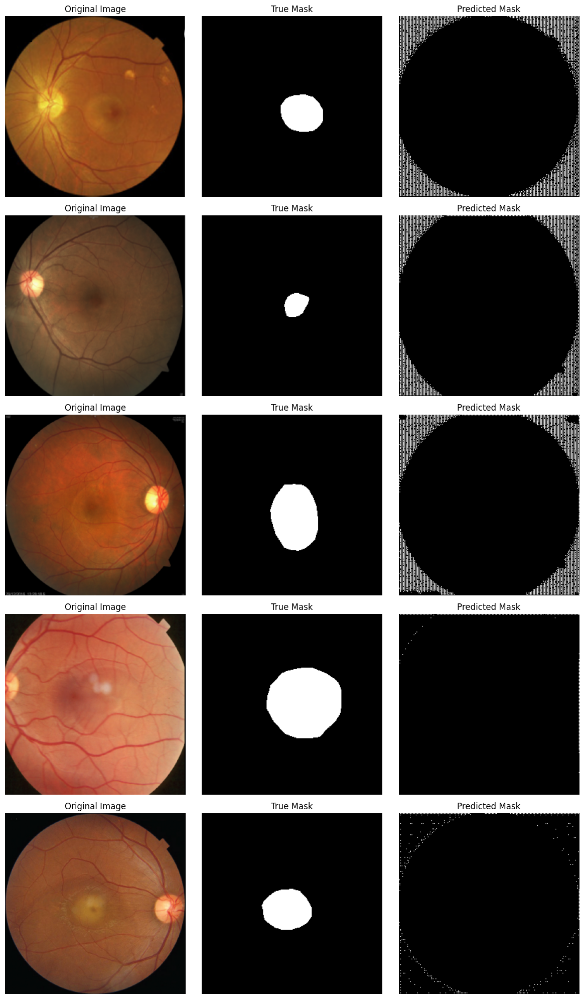

Training completed successfully!
Best model saved at: /kaggle/working/best_segmentation_model.h5
Final model saved at: /kaggle/working/final_segmentation_model.h5


In [4]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import os
from glob import glob
from sklearn.model_selection import train_test_split
import cv2
from tqdm import tqdm

# Configuration
IMG_HEIGHT = 256
IMG_WIDTH = 256
CHANNELS = 3
BATCH_SIZE = 16
EPOCHS = 1000
LEARNING_RATE = 1e-4

# Data paths
IMAGES_PATH = "/kaggle/working/images1"
MASKS_PATH = "/kaggle/working/masks1"

# Set memory growth for GPU
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)

def downsample(filters, size, apply_batchnorm=True):
    """Downsampling block for encoder"""
    initializer = tf.random_normal_initializer(0., 0.02)
    
    result = tf.keras.Sequential()
    result.add(
        tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))
    
    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())
    
    result.add(tf.keras.layers.LeakyReLU())
    
    return result

def upsample(filters, size, apply_dropout=False):
    """Upsampling block for decoder"""
    initializer = tf.random_normal_initializer(0., 0.02)
    
    result = tf.keras.Sequential()
    result.add(
        tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      use_bias=False))
    
    result.add(tf.keras.layers.BatchNormalization())
    
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    
    result.add(tf.keras.layers.ReLU())
    
    return result

def segmentation_generator():
    """Pix2pix-style generator adapted for segmentation"""
    inputs = tf.keras.layers.Input(shape=[IMG_HEIGHT, IMG_WIDTH, CHANNELS])
    
    # Encoder (Downsampling path)
    down_stack = [
        downsample(64, 4, apply_batchnorm=False),  # (bs, 128, 128, 64)
        downsample(128, 4),                        # (bs, 64, 64, 128)
        downsample(256, 4),                        # (bs, 32, 32, 256)
        downsample(512, 4),                        # (bs, 16, 16, 512)
        downsample(512, 4),                        # (bs, 8, 8, 512)
        downsample(512, 4),                        # (bs, 4, 4, 512)
        downsample(512, 4),                        # (bs, 2, 2, 512)
        downsample(512, 4),                        # (bs, 1, 1, 512)
    ]
    
    # Decoder (Upsampling path)
    up_stack = [
        upsample(512, 4, apply_dropout=True),      # (bs, 2, 2, 1024)
        upsample(512, 4, apply_dropout=True),      # (bs, 4, 4, 1024)
        upsample(512, 4, apply_dropout=True),      # (bs, 8, 8, 1024)
        upsample(512, 4),                          # (bs, 16, 16, 1024)
        upsample(256, 4),                          # (bs, 32, 32, 512)
        upsample(128, 4),                          # (bs, 64, 64, 256)
        upsample(64, 4),                           # (bs, 128, 128, 128)
    ]
    
    # Final layer for single channel segmentation
    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(
        1, 4, strides=2, padding='same',
        kernel_initializer=initializer, activation='sigmoid'
    )  # (bs, 256, 256, 1)
    
    x = inputs
    
    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    
    skips = reversed(skips[:-1])
    
    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])
    
    x = last(x)
    
    return tf.keras.Model(inputs=inputs, outputs=x, name='segmentation_generator')

# Custom metrics for segmentation
def dice_coefficient(y_true, y_pred, smooth=1e-6):
    """Dice coefficient for segmentation evaluation"""
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    """IoU (Intersection over Union) score"""
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    union = tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) - intersection
    return (intersection + smooth) / (union + smooth)

def focal_loss(alpha=0.25, gamma=2.0):
    """Focal loss for handling class imbalance"""
    def focal_loss_fixed(y_true, y_pred):
        epsilon = tf.keras.backend.epsilon()
        y_pred = tf.clip_by_value(y_pred, epsilon, 1. - epsilon)
        p_t = tf.where(tf.equal(y_true, 1), y_pred, 1 - y_pred)
        alpha_factor = tf.ones_like(y_true) * alpha
        alpha_t = tf.where(tf.equal(y_true, 1), alpha_factor, 1 - alpha_factor)
        cross_entropy = -tf.math.log(p_t)
        weight = alpha_t * tf.pow((1 - p_t), gamma)
        loss = weight * cross_entropy
        return tf.reduce_mean(loss)
    return focal_loss_fixed

def load_and_preprocess_data():
    """Load and preprocess images and masks"""
    print("Loading data...")
    
    # Get all image and mask paths
    image_paths = glob(os.path.join(IMAGES_PATH, "*"))
    mask_paths = glob(os.path.join(MASKS_PATH, "*"))
    
    # Sort to ensure matching
    image_paths.sort()
    mask_paths.sort()
    
    print(f"Found {len(image_paths)} images and {len(mask_paths)} masks")
    
    if len(image_paths) != len(mask_paths):
        print("Warning: Number of images and masks don't match!")
    
    images = []
    masks = []
    
    for img_path, mask_path in tqdm(zip(image_paths, mask_paths), total=len(image_paths)):
        # Load and preprocess image
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
        img = img.astype(np.float32) / 255.0
        
        # Load and preprocess mask
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        mask = cv2.resize(mask, (IMG_WIDTH, IMG_HEIGHT))
        mask = mask.astype(np.float32) / 255.0
        mask = np.expand_dims(mask, axis=-1)  # Add channel dimension
        
        images.append(img)
        masks.append(mask)
    
    return np.array(images), np.array(masks)

def create_data_generator(images, masks, batch_size, shuffle=True):
    """Create data generator with augmentation"""
    def augment_data(image, mask):
        # Random horizontal flip
        if tf.random.uniform(()) > 0.5:
            image = tf.image.flip_left_right(image)
            mask = tf.image.flip_left_right(mask)
        
        # Random rotation
        if tf.random.uniform(()) > 0.5:
            angle = tf.random.uniform((), -0.2, 0.2)
            image = tf.image.rot90(image, k=tf.cast(angle * 2, tf.int32))
            mask = tf.image.rot90(mask, k=tf.cast(angle * 2, tf.int32))
        
        # Random brightness and contrast for image only
        if tf.random.uniform(()) > 0.5:
            image = tf.image.random_brightness(image, 0.1)
            image = tf.image.random_contrast(image, 0.9, 1.1)
        
        # Ensure values are in valid range
        image = tf.clip_by_value(image, 0.0, 1.0)
        mask = tf.clip_by_value(mask, 0.0, 1.0)
        
        return image, mask
    
    dataset = tf.data.Dataset.from_tensor_slices((images, masks))
    
    if shuffle:
        dataset = dataset.shuffle(buffer_size=1000)
    
    dataset = dataset.map(augment_data, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    
    return dataset

def plot_predictions(model, test_images, test_masks, num_samples=3):
    """Plot some prediction examples"""
    predictions = model.predict(test_images[:num_samples])
    
    fig, axes = plt.subplots(num_samples, 3, figsize=(12, 4*num_samples))
    
    for i in range(num_samples):
        # Original image
        axes[i, 0].imshow(test_images[i])
        axes[i, 0].set_title('Original Image')
        axes[i, 0].axis('off')
        
        # True mask
        axes[i, 1].imshow(test_masks[i].squeeze(), cmap='gray')
        axes[i, 1].set_title('True Mask')
        axes[i, 1].axis('off')
        
        # Predicted mask
        pred_mask = (predictions[i].squeeze() > 0.5).astype(np.uint8)
        axes[i, 2].imshow(pred_mask, cmap='gray')
        axes[i, 2].set_title('Predicted Mask')
        axes[i, 2].axis('off')
    
    plt.tight_layout()
    plt.savefig('/kaggle/working/predictions.png', dpi=150, bbox_inches='tight')
    plt.show()

def main():
    print("Starting segmentation training...")
    
    # Load data
    images, masks = load_and_preprocess_data()
    print(f"Loaded {len(images)} image-mask pairs")
    print(f"Image shape: {images[0].shape}")
    print(f"Mask shape: {masks[0].shape}")
    
    # Split data
    X_train, X_test, y_train, y_test = train_test_split(
        images, masks, test_size=0.2, random_state=42
    )
    X_train, X_val, y_train, y_val = train_test_split(
        X_train, y_train, test_size=0.2, random_state=42
    )
    
    print(f"Training set: {len(X_train)} samples")
    print(f"Validation set: {len(X_val)} samples") 
    print(f"Test set: {len(X_test)} samples")
    
    # Create data generators
    train_dataset = create_data_generator(X_train, y_train, BATCH_SIZE, shuffle=True)
    val_dataset = create_data_generator(X_val, y_val, BATCH_SIZE, shuffle=False)
    
    # Create model
    print("Creating model...")
    model = segmentation_generator()
    
    # Compile model
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE, beta_1=0.5),
        loss=focal_loss(alpha=0.25, gamma=2.0),  # Using focal loss
        metrics=['accuracy', dice_coefficient, iou_score]
    )
    
    print("Model summary:")
    model.summary()
    
    # Callbacks
    callbacks = [
        tf.keras.callbacks.EarlyStopping(
            monitor='val_dice_coefficient',
            patience=15,
            restore_best_weights=True,
            mode='max'
        ),
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor='val_dice_coefficient',
            factor=0.5,
            patience=8,
            min_lr=1e-7,
            mode='max'
        ),
        tf.keras.callbacks.ModelCheckpoint(
            '/kaggle/working/best_segmentation_model.h5',
            monitor='val_dice_coefficient',
            save_best_only=True,
            mode='max'
        ),
        tf.keras.callbacks.CSVLogger('/kaggle/working/training_log.csv')
    ]
    
    # Train model
    print("Starting training...")
    history = model.fit(
        train_dataset,
        epochs=EPOCHS,
        validation_data=val_dataset,
        callbacks=callbacks,
        verbose=1
    )
    
    # Save final model
    model.save('/kaggle/working/final_segmentation_model.h5')
    print("Final model saved!")
    
    # Evaluate on test set
    print("Evaluating on test set...")
    test_dataset = create_data_generator(X_test, y_test, BATCH_SIZE, shuffle=False)
    test_results = model.evaluate(test_dataset, verbose=1)
    
    print("\nTest Results:")
    for name, value in zip(model.metrics_names, test_results):
        print(f"{name}: {value:.4f}")
    
    # Plot training history
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    
    plt.subplot(1, 3, 2)
    plt.plot(history.history['dice_coefficient'], label='Training Dice')
    plt.plot(history.history['val_dice_coefficient'], label='Validation Dice')
    plt.title('Dice Coefficient')
    plt.xlabel('Epoch')
    plt.ylabel('Dice Score')
    plt.legend()
    
    plt.subplot(1, 3, 3)
    plt.plot(history.history['iou_score'], label='Training IoU')
    plt.plot(history.history['val_iou_score'], label='Validation IoU')
    plt.title('IoU Score')
    plt.xlabel('Epoch')
    plt.ylabel('IoU')
    plt.legend()
    
    plt.tight_layout()
    plt.savefig('/kaggle/working/training_history.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    # Plot some predictions
    print("Generating prediction examples...")
    plot_predictions(model, X_test, y_test, num_samples=5)
    
    print("Training completed successfully!")
    print(f"Best model saved at: /kaggle/working/best_segmentation_model.h5")
    print(f"Final model saved at: /kaggle/working/final_segmentation_model.h5")

if __name__ == "__main__":
    main()

Starting macular segmentation training with green channel enhancement...
Loading data...
Found 115 images and 115 masks
Showing channel comparison for first image...


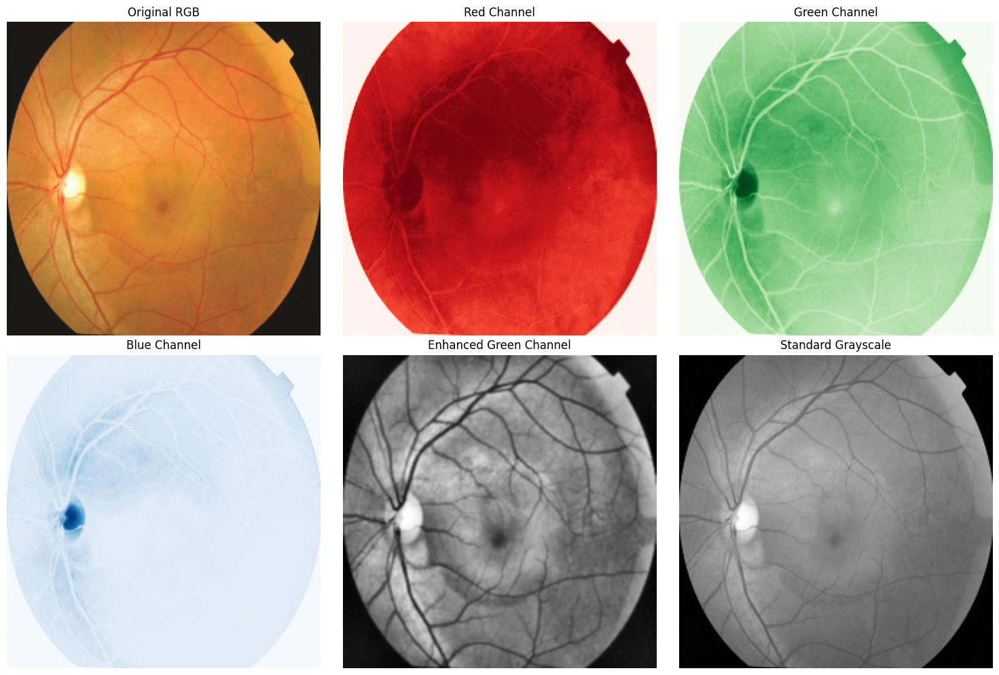

100%|██████████| 115/115 [00:00<00:00, 294.38it/s]


Loaded 115 image-mask pairs
Image shape: (256, 256, 1)
Mask shape: (256, 256, 1)
Positive pixels ratio: 0.0765
Training set: 73 samples
Validation set: 19 samples
Test set: 23 samples
Creating model...
Model summary:


Model: "functional_32"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_34      │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_54 (Conv2D)  │ (None, 256, 256,  │        320 │ input_layer_34[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        128 │ conv2d_54[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_55 (Conv2D)  │ (None, 256, 256,  │      9,248 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        128 │ conv2d_55[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_8     │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_24          │ (None, 128, 128,  │          0 │ max_pooling2d_8[… │
│ (Dropout)           │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_56 (Conv2D)  │ (None, 128, 128,  │     18,496 │ dropout_24[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_56[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_57 (Conv2D)  │ (None, 128, 128,  │     36,928 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_57[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_9     │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_25          │ (None, 64, 64,    │          0 │ max_pooling2d_9[… │
│ (Dropout)           │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_58 (Conv2D)  │ (None, 64, 64,    │     73,856 │ dropout_25[0][0]  │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_58[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_59 (Conv2D)  │ (None, 64, 64,    │    147,584 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_59[0][0] 

 Total params: 7,771,297 (29.65 MB)

 Trainable params: 7,765,409 (29.62 MB)

 Non-trainable params: 5,888 (23.00 KB)

Starting training...
Epoch 1/500


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_272']
Received: inputs=Tensor(shape=(None, 256, 256, 1))
  warnings.warn(msg)


10/10 ━━━━━━━━━━━━━━━━━━━━ 52s 2s/step - accuracy: 0.5091 - dice_coefficient: 0.1103 - iou_score: 0.0589 - loss: 2.5750 - val_accuracy: 0.8711 - val_dice_coefficient: 0.1423 - val_iou_score: 0.0773 - val_loss: 2.3031 - learning_rate: 2.0000e-04
Epoch 2/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 188ms/step - accuracy: 0.5118 - dice_coefficient: 0.1487 - iou_score: 0.0809 - loss: 2.4243 - val_accuracy: 0.8769 - val_dice_coefficient: 0.1418 - val_iou_score: 0.0770 - val_loss: 2.2941 - learning_rate: 2.0000e-04
Epoch 3/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 235ms/step - accuracy: 0.5923 - dice_coefficient: 0.1797 - iou_score: 0.0992 - loss: 2.3021 - val_accuracy: 0.4627 - val_dice_coefficient: 0.1436 - val_iou_score: 0.0780 - val_loss: 2.3157 - learning_rate: 2.0000e-04
Epoch 4/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 238ms/step - accuracy: 0.6878 - dice_coefficient: 0.2001 - iou_score: 0.1120 - loss: 2.2237 - val_accuracy: 0.9029 - val_dice_coefficient: 0.1437 - val_iou_score: 0.0781 - val_loss: 2.2536 - lear

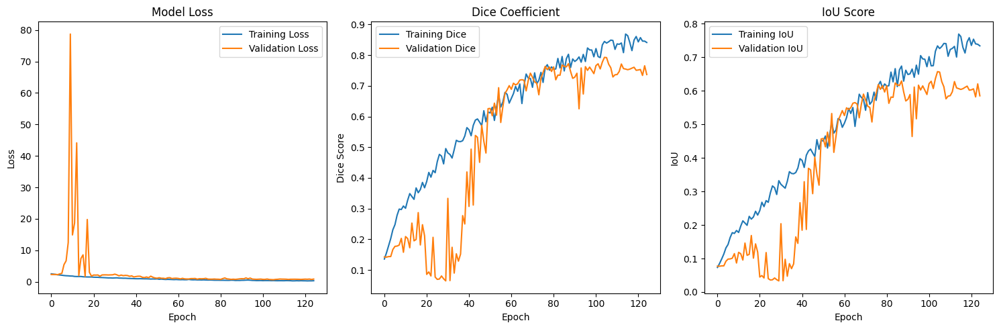

Generating prediction examples...


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_272']
Received: inputs=Tensor(shape=(6, 256, 256, 1))
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


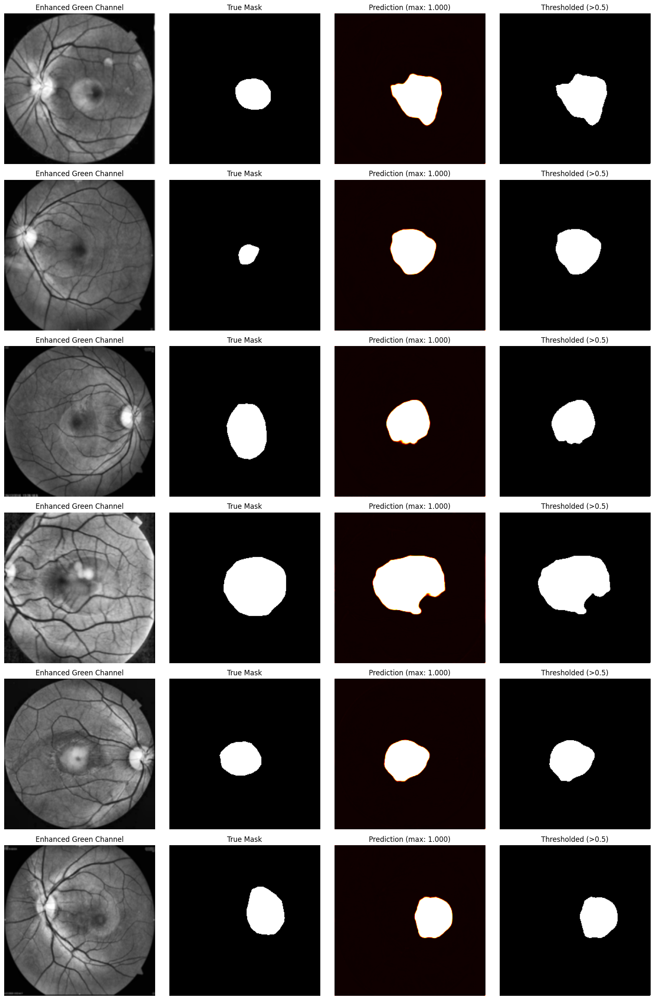

Training completed successfully!
Best model saved at: /kaggle/working/best_macular_model.h5
Final model saved at: /kaggle/working/final_macular_model.h5


In [6]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import os
from glob import glob
from sklearn.model_selection import train_test_split
import cv2
from tqdm import tqdm

# Configuration - OPTIMIZED FOR MACULAR SEGMENTATION
IMG_HEIGHT = 256
IMG_WIDTH = 256
CHANNELS = 1  # Single channel (green channel extraction)
BATCH_SIZE = 8
EPOCHS = 500
LEARNING_RATE = 2e-4

# Data paths
IMAGES_PATH = "/kaggle/working/images1"
MASKS_PATH = "/kaggle/working/masks1"

# Set memory growth for GPU
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)

def extract_best_channel_and_enhance(image):
    """
    Extract the best channel for macular visibility and enhance it
    Green channel is typically best for macular segmentation
    """
    # Extract green channel (index 1)
    green_channel = image[:, :, 1]
    
    # Apply CLAHE for local contrast enhancement
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    enhanced = clahe.apply((green_channel * 255).astype(np.uint8))
    
    # Additional enhancement - Gaussian blur to reduce noise
    enhanced = cv2.GaussianBlur(enhanced, (3, 3), 0)
    
    # Normalize back to 0-1
    enhanced = enhanced.astype(np.float32) / 255.0
    
    return enhanced

def compare_channels(image):
    """Helper function to visualize different channels"""
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    
    # Original RGB
    axes[0, 0].imshow(image)
    axes[0, 0].set_title('Original RGB')
    axes[0, 0].axis('off')
    
    # Red channel
    axes[0, 1].imshow(image[:, :, 0], cmap='Reds')
    axes[0, 1].set_title('Red Channel')
    axes[0, 1].axis('off')
    
    # Green channel
    axes[0, 2].imshow(image[:, :, 1], cmap='Greens')
    axes[0, 2].set_title('Green Channel')
    axes[0, 2].axis('off')
    
    # Blue channel
    axes[1, 0].imshow(image[:, :, 2], cmap='Blues')
    axes[1, 0].set_title('Blue Channel')
    axes[1, 0].axis('off')
    
    # Enhanced green
    enhanced = extract_best_channel_and_enhance(image)
    axes[1, 1].imshow(enhanced, cmap='gray')
    axes[1, 1].set_title('Enhanced Green Channel')
    axes[1, 1].axis('off')
    
    # Grayscale for comparison
    gray = cv2.cvtColor((image * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
    axes[1, 2].imshow(gray, cmap='gray')
    axes[1, 2].set_title('Standard Grayscale')
    axes[1, 2].axis('off')
    
    plt.tight_layout()
    plt.savefig('/kaggle/working/channel_comparison.png', dpi=150, bbox_inches='tight')
    plt.show()

def simple_unet():
    """
    Simplified U-Net for macular segmentation
    Focus on capturing subtle circular features
    """
    inputs = layers.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
    
    # Encoder
    # Block 1
    c1 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    c1 = layers.BatchNormalization()(c1)
    c1 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(c1)
    c1 = layers.BatchNormalization()(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)
    p1 = layers.Dropout(0.1)(p1)
    
    # Block 2
    c2 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(p1)
    c2 = layers.BatchNormalization()(c2)
    c2 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c2)
    c2 = layers.BatchNormalization()(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)
    p2 = layers.Dropout(0.1)(p2)
    
    # Block 3
    c3 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p2)
    c3 = layers.BatchNormalization()(c3)
    c3 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c3)
    c3 = layers.BatchNormalization()(c3)
    p3 = layers.MaxPooling2D((2, 2))(c3)
    p3 = layers.Dropout(0.2)(p3)
    
    # Block 4
    c4 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(p3)
    c4 = layers.BatchNormalization()(c4)
    c4 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c4)
    c4 = layers.BatchNormalization()(c4)
    p4 = layers.MaxPooling2D((2, 2))(c4)
    p4 = layers.Dropout(0.2)(p4)
    
    # Bottleneck
    c5 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(p4)
    c5 = layers.BatchNormalization()(c5)
    c5 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(c5)
    c5 = layers.BatchNormalization()(c5)
    c5 = layers.Dropout(0.3)(c5)
    
    # Decoder
    # Block 6
    u6 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = layers.concatenate([u6, c4])
    c6 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(u6)
    c6 = layers.BatchNormalization()(c6)
    c6 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c6)
    c6 = layers.BatchNormalization()(c6)
    c6 = layers.Dropout(0.2)(c6)
    
    # Block 7
    u7 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = layers.concatenate([u7, c3])
    c7 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(u7)
    c7 = layers.BatchNormalization()(c7)
    c7 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c7)
    c7 = layers.BatchNormalization()(c7)
    c7 = layers.Dropout(0.2)(c7)
    
    # Block 8
    u8 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = layers.concatenate([u8, c2])
    c8 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u8)
    c8 = layers.BatchNormalization()(c8)
    c8 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c8)
    c8 = layers.BatchNormalization()(c8)
    c8 = layers.Dropout(0.1)(c8)
    
    # Block 9
    u9 = layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = layers.concatenate([u9, c1])
    c9 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(u9)
    c9 = layers.BatchNormalization()(c9)
    c9 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(c9)
    c9 = layers.BatchNormalization()(c9)
    c9 = layers.Dropout(0.1)(c9)
    
    # Output layer
    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(c9)
    
    model = keras.Model(inputs=[inputs], outputs=[outputs])
    return model

# Custom loss functions for macular segmentation
def combined_loss(y_true, y_pred):
    """Combined loss: BCE + Dice + Tversky for handling class imbalance"""
    # Binary crossentropy
    bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    
    # Dice loss
    smooth = 1e-6
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    dice_loss = 1 - (2. * intersection + smooth) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth)
    
    # Tversky loss (focuses more on false negatives)
    alpha = 0.3
    beta = 0.7
    tp = tf.keras.backend.sum(y_true_f * y_pred_f)
    fp = tf.keras.backend.sum((1 - y_true_f) * y_pred_f)
    fn = tf.keras.backend.sum(y_true_f * (1 - y_pred_f))
    tversky_loss = 1 - (tp + smooth) / (tp + alpha * fp + beta * fn + smooth)
    
    return bce + dice_loss + tversky_loss

def dice_coefficient(y_true, y_pred, smooth=1e-6):
    """Dice coefficient for evaluation"""
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    """IoU score for evaluation"""
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    union = tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) - intersection
    return (intersection + smooth) / (union + smooth)

def load_and_preprocess_data():
    """Load and preprocess images and masks with green channel extraction"""
    print("Loading data...")
    
    # Get all image and mask paths
    image_paths = glob(os.path.join(IMAGES_PATH, "*"))
    mask_paths = glob(os.path.join(MASKS_PATH, "*"))
    
    # Sort to ensure matching
    image_paths.sort()
    mask_paths.sort()
    
    print(f"Found {len(image_paths)} images and {len(mask_paths)} masks")
    
    if len(image_paths) != len(mask_paths):
        print("Warning: Number of images and masks don't match!")
    
    images = []
    masks = []
    
    # Show channel comparison for first image
    if len(image_paths) > 0:
        sample_img = cv2.imread(image_paths[0])
        sample_img = cv2.cvtColor(sample_img, cv2.COLOR_BGR2RGB)
        sample_img = cv2.resize(sample_img, (IMG_WIDTH, IMG_HEIGHT))
        sample_img = sample_img.astype(np.float32) / 255.0
        print("Showing channel comparison for first image...")
        compare_channels(sample_img)
    
    for img_path, mask_path in tqdm(zip(image_paths, mask_paths), total=len(image_paths)):
        # Load and preprocess image
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
        img = img.astype(np.float32) / 255.0
        
        # Extract and enhance green channel
        img_processed = extract_best_channel_and_enhance(img)
        img_processed = np.expand_dims(img_processed, axis=-1)  # Add channel dimension
        
        # Load and preprocess mask
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        mask = cv2.resize(mask, (IMG_WIDTH, IMG_HEIGHT))
        
        # Ensure binary mask
        mask = (mask > 128).astype(np.float32)  # Threshold at 128
        mask = np.expand_dims(mask, axis=-1)  # Add channel dimension
        
        images.append(img_processed)
        masks.append(mask)
    
    return np.array(images), np.array(masks)

def create_data_generator(images, masks, batch_size, shuffle=True):
    """Create data generator with augmentation"""
    def augment_data(image, mask):
        # Random horizontal flip
        if tf.random.uniform(()) > 0.5:
            image = tf.image.flip_left_right(image)
            mask = tf.image.flip_left_right(mask)
        
        # Random rotation (small angles)
        if tf.random.uniform(()) > 0.5:
            angle = tf.random.uniform((), -0.1, 0.1)  # Small rotation for medical images
            image = tf.image.rot90(image, k=tf.cast(angle * 2, tf.int32))
            mask = tf.image.rot90(mask, k=tf.cast(angle * 2, tf.int32))
        
        # Random contrast adjustment for image only
        if tf.random.uniform(()) > 0.5:
            image = tf.image.random_contrast(image, 0.8, 1.2)
        
        # Ensure values are in valid range
        image = tf.clip_by_value(image, 0.0, 1.0)
        mask = tf.clip_by_value(mask, 0.0, 1.0)
        
        return image, mask
    
    dataset = tf.data.Dataset.from_tensor_slices((images, masks))
    
    if shuffle:
        dataset = dataset.shuffle(buffer_size=1000)
    
    dataset = dataset.map(augment_data, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    
    return dataset

def plot_predictions(model, test_images, test_masks, num_samples=4):
    """Plot prediction examples with threshold analysis"""
    predictions = model.predict(test_images[:num_samples])
    
    fig, axes = plt.subplots(num_samples, 4, figsize=(16, 4*num_samples))
    
    for i in range(num_samples):
        # Enhanced green channel input
        axes[i, 0].imshow(test_images[i].squeeze(), cmap='gray')
        axes[i, 0].set_title('Enhanced Green Channel')
        axes[i, 0].axis('off')
        
        # True mask
        axes[i, 1].imshow(test_masks[i].squeeze(), cmap='gray')
        axes[i, 1].set_title('True Mask')
        axes[i, 1].axis('off')
        
        # Raw prediction (probability map)
        axes[i, 2].imshow(predictions[i].squeeze(), cmap='hot', vmin=0, vmax=1)
        axes[i, 2].set_title(f'Prediction (max: {predictions[i].max():.3f})')
        axes[i, 2].axis('off')
        
        # Thresholded prediction
        pred_thresh = (predictions[i].squeeze() > 0.5).astype(np.uint8)
        axes[i, 3].imshow(pred_thresh, cmap='gray')
        axes[i, 3].set_title('Thresholded (>0.5)')
        axes[i, 3].axis('off')
    
    plt.tight_layout()
    plt.savefig('/kaggle/working/predictions.png', dpi=150, bbox_inches='tight')
    plt.show()

def main():
    print("Starting macular segmentation training with green channel enhancement...")
    
    # Load data
    images, masks = load_and_preprocess_data()
    print(f"Loaded {len(images)} image-mask pairs")
    print(f"Image shape: {images[0].shape}")
    print(f"Mask shape: {masks[0].shape}")
    print(f"Positive pixels ratio: {np.mean(masks):.4f}")
    
    # Split data
    X_train, X_test, y_train, y_test = train_test_split(
        images, masks, test_size=0.2, random_state=42
    )
    X_train, X_val, y_train, y_val = train_test_split(
        X_train, y_train, test_size=0.2, random_state=42
    )
    
    print(f"Training set: {len(X_train)} samples")
    print(f"Validation set: {len(X_val)} samples") 
    print(f"Test set: {len(X_test)} samples")
    
    # Create data generators
    train_dataset = create_data_generator(X_train, y_train, BATCH_SIZE, shuffle=True)
    val_dataset = create_data_generator(X_val, y_val, BATCH_SIZE, shuffle=False)
    
    # Create model
    print("Creating model...")
    model = simple_unet()
    
    # Compile model with combined loss
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE),
        loss=combined_loss,
        metrics=['accuracy', dice_coefficient, iou_score]
    )
    
    print("Model summary:")
    model.summary()
    
    # Callbacks
    callbacks = [
        tf.keras.callbacks.EarlyStopping(
            monitor='val_dice_coefficient',
            patience=20,
            restore_best_weights=True,
            mode='max'
        ),
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor='val_dice_coefficient',
            factor=0.5,
            patience=10,
            min_lr=1e-7,
            mode='max'
        ),
        tf.keras.callbacks.ModelCheckpoint(
            '/kaggle/working/best_macular_model.h5',
            monitor='val_dice_coefficient',
            save_best_only=True,
            mode='max'
        ),
        tf.keras.callbacks.CSVLogger('/kaggle/working/training_log.csv')
    ]
    
    # Train model
    print("Starting training...")
    history = model.fit(
        train_dataset,
        epochs=EPOCHS,
        validation_data=val_dataset,
        callbacks=callbacks,
        verbose=1
    )
    
    # Save final model
    model.save('/kaggle/working/final_macular_model.h5')
    print("Final model saved!")
    
    # Evaluate on test set
    print("Evaluating on test set...")
    test_dataset = create_data_generator(X_test, y_test, BATCH_SIZE, shuffle=False)
    test_results = model.evaluate(test_dataset, verbose=1)
    
    print("\nTest Results:")
    for name, value in zip(model.metrics_names, test_results):
        print(f"{name}: {value:.4f}")
    
    # Plot training history
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    
    plt.subplot(1, 3, 2)
    plt.plot(history.history['dice_coefficient'], label='Training Dice')
    plt.plot(history.history['val_dice_coefficient'], label='Validation Dice')
    plt.title('Dice Coefficient')
    plt.xlabel('Epoch')
    plt.ylabel('Dice Score')
    plt.legend()
    
    plt.subplot(1, 3, 3)
    plt.plot(history.history['iou_score'], label='Training IoU')
    plt.plot(history.history['val_iou_score'], label='Validation IoU')
    plt.title('IoU Score')
    plt.xlabel('Epoch')
    plt.ylabel('IoU')
    plt.legend()
    
    plt.tight_layout()
    plt.savefig('/kaggle/working/training_history.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    # Plot predictions with detailed analysis
    print("Generating prediction examples...")
    plot_predictions(model, X_test, y_test, num_samples=6)
    
    print("Training completed successfully!")
    print(f"Best model saved at: /kaggle/working/best_macular_model.h5")
    print(f"Final model saved at: /kaggle/working/final_macular_model.h5")

if __name__ == "__main__":
    main()